## Fit GMM Models with age and durations

comix1 0.4579780904596587 81517
comix2 0.619546693933197 152568
comix3 0.5853197379971639 88854
comixa 0.17207240683724387 37676
comixb 0.3592137747673609 63188
comixc 0.5684212869523922 134768


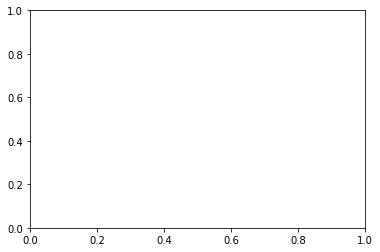

In [ ]:
## 45x9 contact matrix... lets hope we have enough data :)
## fit to networks and create a dpln network
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


data = 'comix3'
df = pd.read_csv(f'../input_data/{data}.csv', sep=',')
df['duration_multi'] = df['duration_multi'].astype('float')
egos, cm = nd_p.fit_data_duration(df=df)

for data in ['comix1','comix2','comix3','comixa','comixb','comixc']:
    df = pd.read_csv(f'../input_data/{data}.csv', sep=',')
    df['duration_multi'] = df['duration_multi'].astype('float')
    val, counts = np.unique(df['duration_multi'],return_counts=True)
    print(data, counts[-1]/sum(counts), sum(counts))
    ## write the degree for each person in each data set 
    # degrees = {}
    # for key in np.unique(df['part_id']):
    #     degrees[key] = len(df[df['part_id'] == key])
    # part_deg = [0 if degrees[a['part_id']]==1 and pd.isna(a['cont_id']) else degrees[a['part_id']] for i,a in df.iterrows()]
    # df['degree'] = part_deg
    # df.to_csv(f'../input_data/{data}.csv', sep=',')

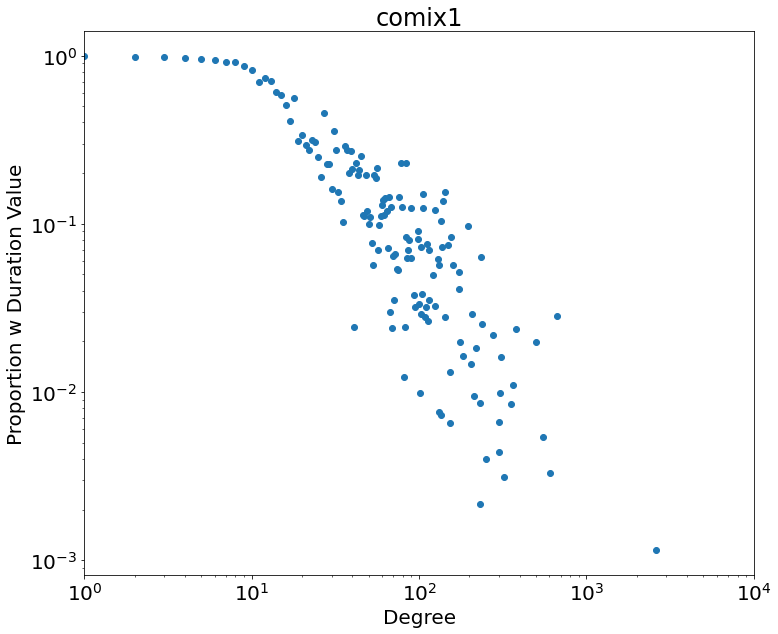

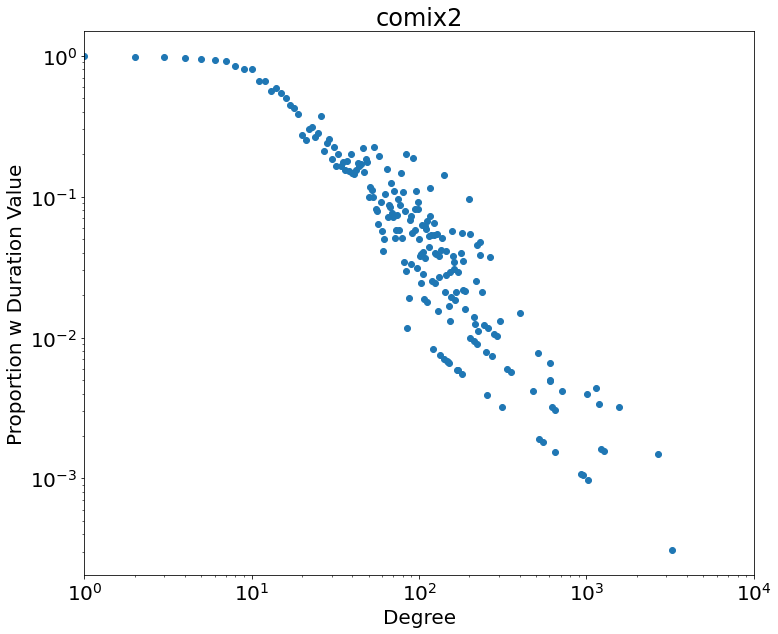

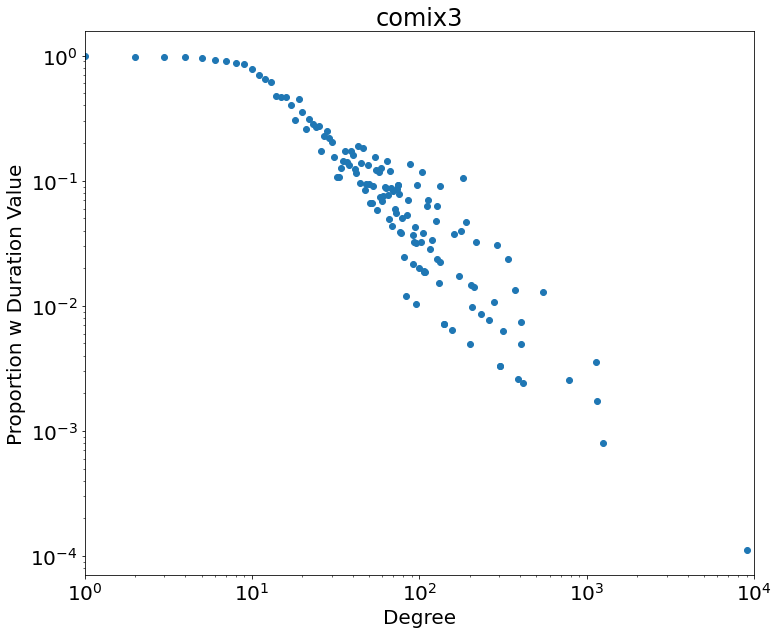

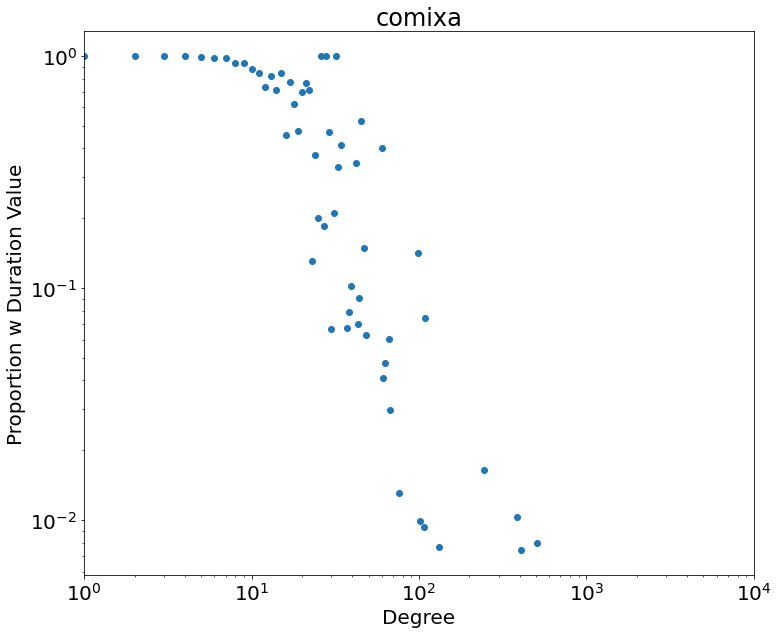

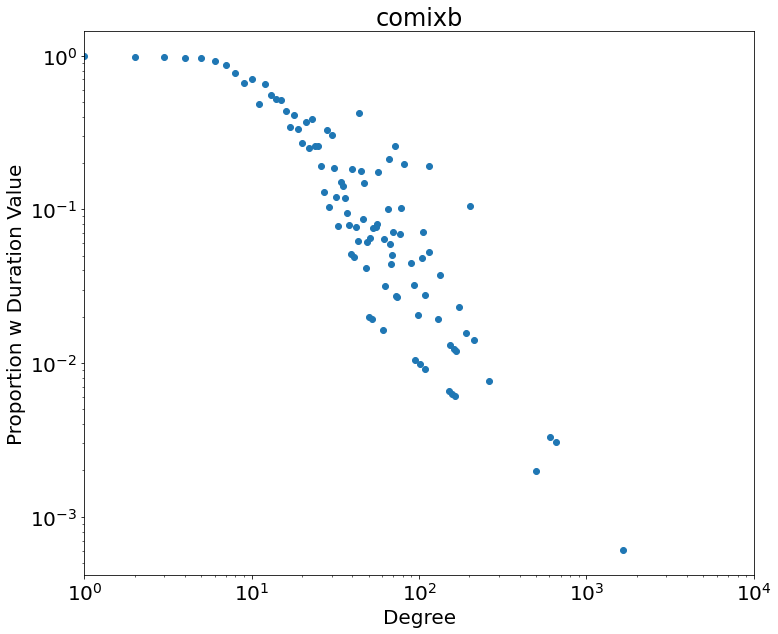

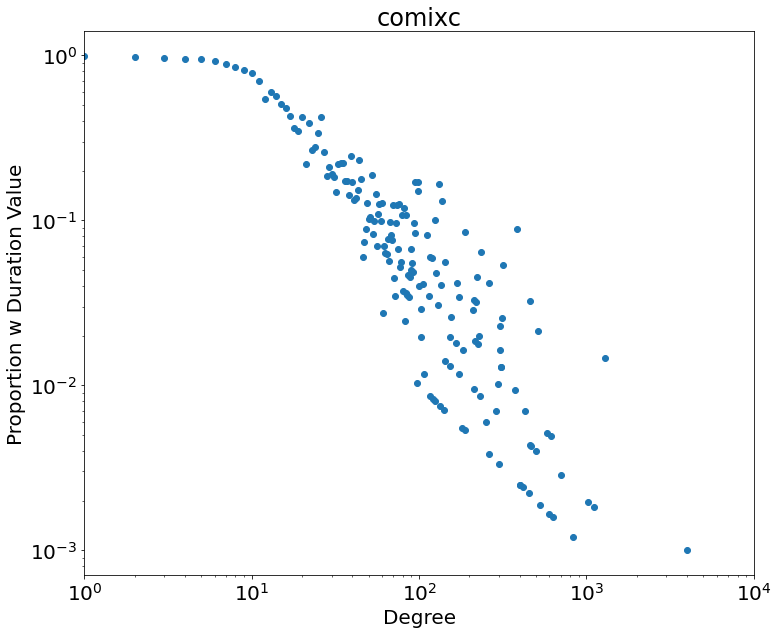

In [24]:
plt.rcParams.update({'font.size': 20})
for data in ['comix1','comix2','comix3','comixa','comixb','comixc']:
    df = pd.read_csv(f'../input_data/{data}.csv', sep=',')
    df['duration_multi'] = df['duration_multi'].astype('float')
    x = np.array(range(max(df['degree'])+1))
    y = np.zeros(max(df['degree'])+1)
    counts = np.zeros(max(df['degree'])+1)
    last = ''
    for i, row in df.iterrows():
        if pd.isna(row['duration_multi']):
            counts[row['degree']] += 1
        else:
            y[row['degree']] += 1
            counts[row['degree']] += 1
    x,y, counts = np.array([a for i,a in enumerate(x) if counts[i]!=0]), np.array([a for i,a in enumerate(y) if counts[i]!=0]), np.array([a for a in counts if a!=0])
    y = y/counts
    plt.figure(figsize=(12,10))
    plt.scatter(x,y)
    plt.title(f'{data}')
    plt.xlim(1,1e4)
    plt.xlabel('Degree')
    plt.ylabel('Proportion w Duration Value')
    # plt.ylim([0,1])
    plt.xscale('log')
    plt.yscale('log')
    plt.show()

In [25]:
print(cm)

[[1.00530504e+00 5.30503979e-03 4.50928382e-02 1.06100796e-01
  4.16445623e-01 5.17241379e-01 7.95755968e-03 1.06100796e-02
  4.24403183e-02 2.33421751e-01 9.54907162e-02 2.65251989e-03
  1.32625995e-02 1.06100796e-02 1.85676393e-02 7.16180371e-02
  7.95755968e-03 2.12201592e-02 4.77453581e-02 2.51989390e-01
  1.40583554e-01 2.12201592e-02 4.24403183e-02 1.69761273e-01
  8.59416446e-01 5.57029178e-02 2.12201592e-02 3.44827586e-02
  1.08753316e-01 4.58885942e-01 1.59151194e-02 5.30503979e-03
  1.32625995e-02 5.57029178e-02 9.28381963e-02 1.14058355e-01
  0.00000000e+00 2.38726790e-02 3.71352785e-02 6.63129973e-02
  2.12201592e-02 0.00000000e+00 1.59151194e-02 1.59151194e-02
  5.03978780e-02]
 [7.16404078e-01 2.78035218e-03 1.57553290e-02 3.24374421e-02
  1.16774791e-01 3.60055607e+00 2.40963855e-02 5.56070436e-02
  2.26135310e-01 6.71918443e-01 1.10009268e+00 1.20481928e-02
  3.05838740e-02 9.73123262e-02 1.69601483e-01 6.02409639e-02
  1.57553290e-02 2.50231696e-02 5.18999073e-02 8.341

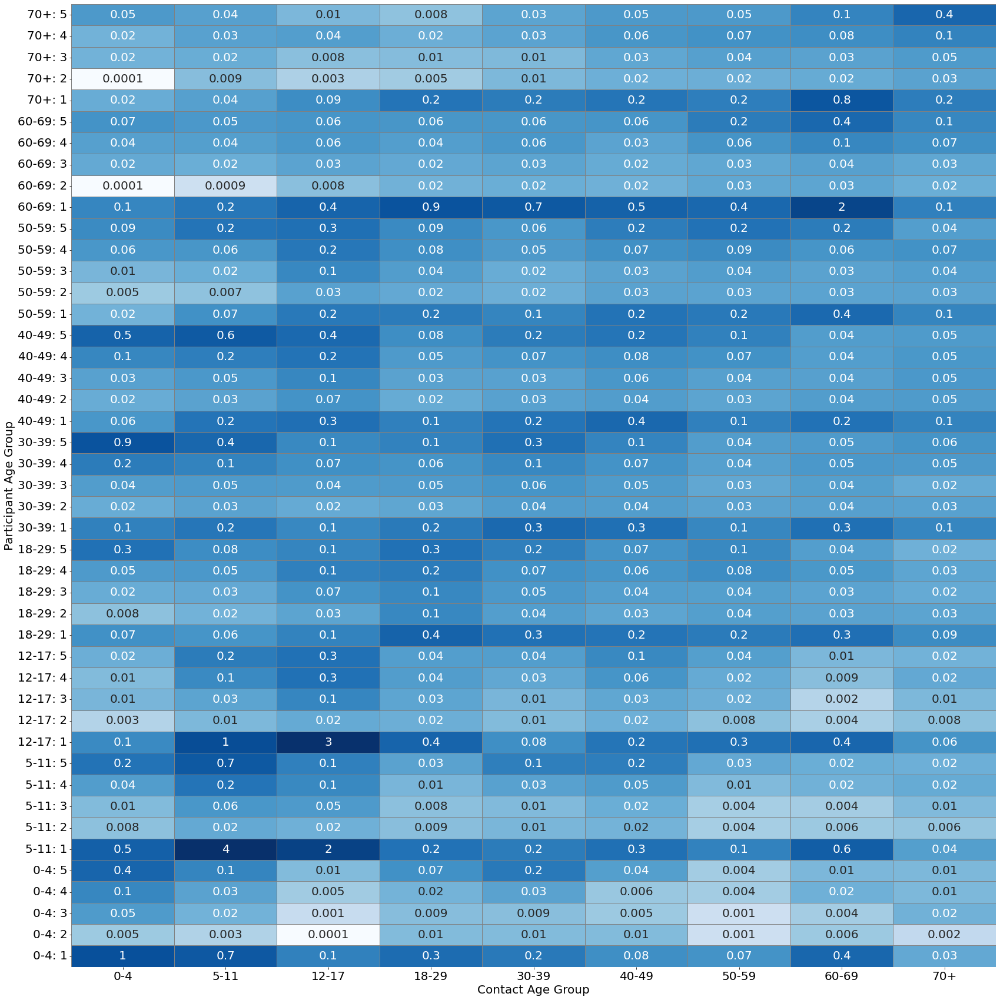

In [29]:
from matplotlib.colors import LogNorm

x_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']

y_base_groups = [a for a in range(1,6)]
y_labels = [f"{group}: {i}" for group in x_labels for i in y_base_groups]
cm = np.array([[b if b!=0 else 1e-4 for b in a] for a in cm])
# Plot
plt.figure(figsize=(24, 24))
sns.heatmap(cm.T[::-1], annot=True, fmt='.1g', cmap='Blues', 
            xticklabels=x_labels, yticklabels=np.flip(y_labels), 
            linewidths=0.5, linecolor='gray',
            norm=LogNorm(vmin=cm.min(), vmax=cm.max()), 
            cbar=False,)

# Axis labels
plt.xlabel("Contact Age Group")
plt.ylabel("Participant Age Group")

plt.tight_layout()
plt.show()

In [ ]:
import json
import pandas as pd

for data in ['comix3', 'comixa','comixb','comixc','poly']:
    df = pd.read_csv(f'../input_data/{data}.csv', sep=',')
    df['duration_multi'] = df['duration_multi'].astype('float')
    egos, cm = nd_p.fit_data_duration(df=df)
    for i in range(len(egos)):
        egos[i]['contacts'] = [a for a in egos[i]['contacts']]
    np.savetxt(f'../input_data/contact_matrices/{data}_dur.csv',cm,delimiter=',')
    with open(f'../input_data/egos/{data}_dur.json', 'w') as f:
        json.dump(egos,f)

comix3 0


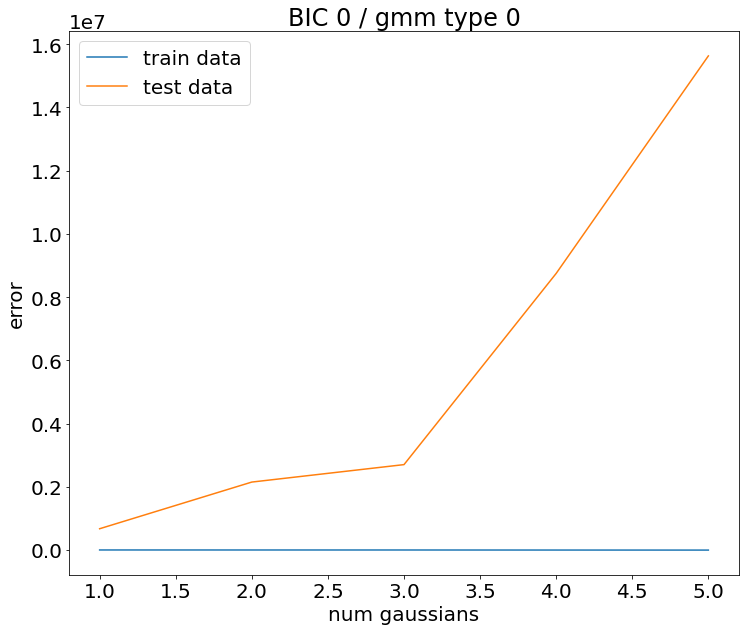

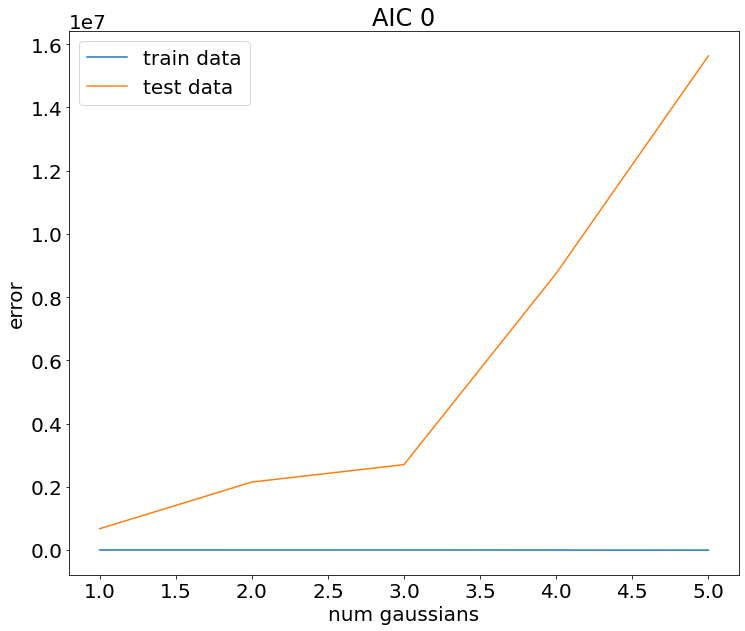

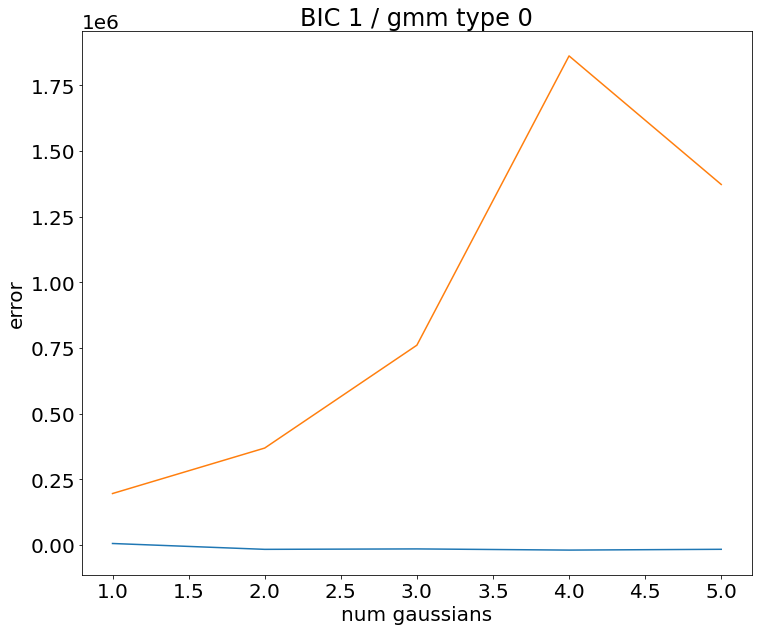

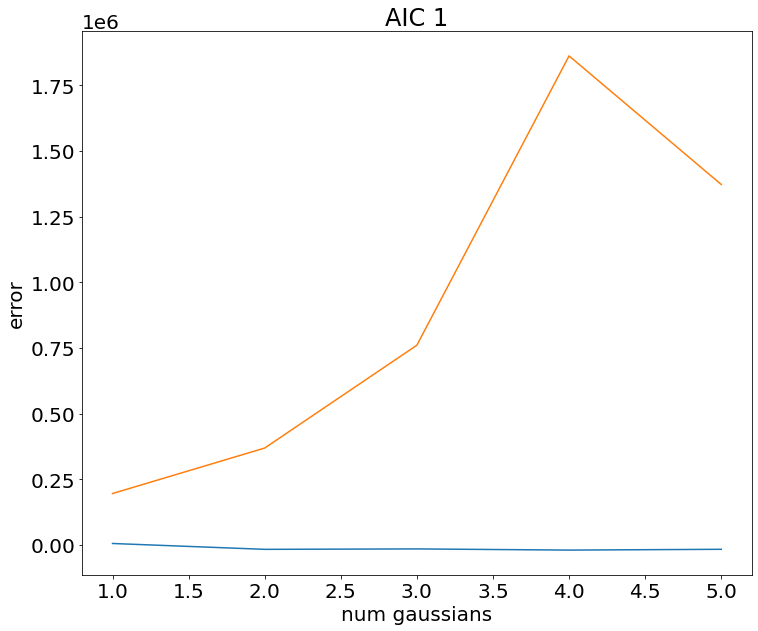

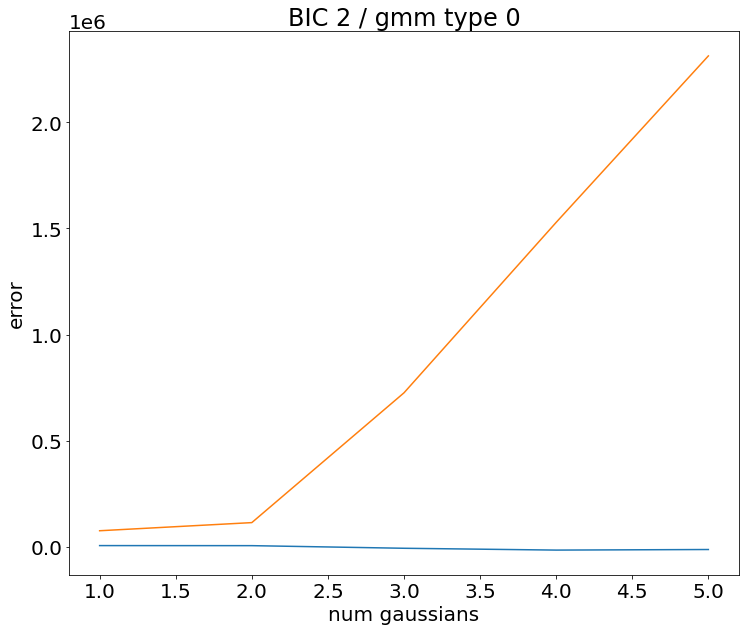

...

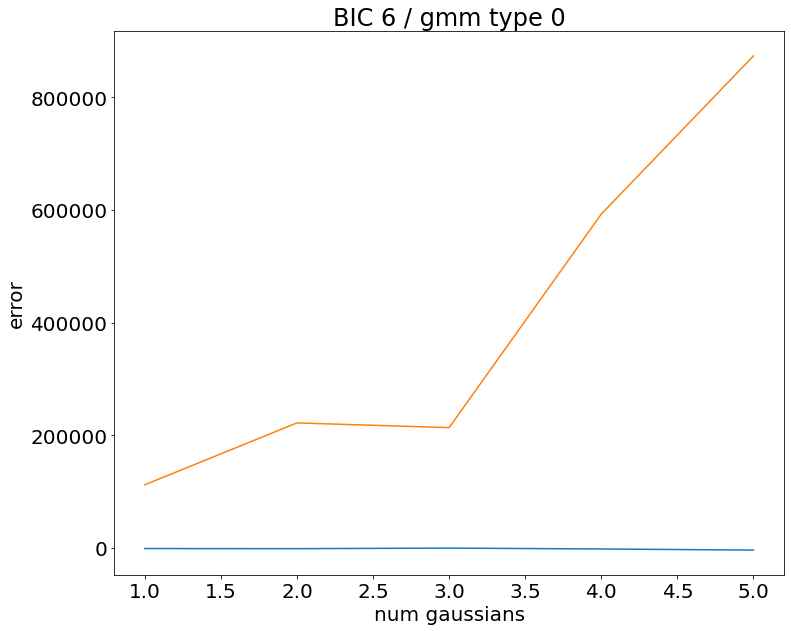

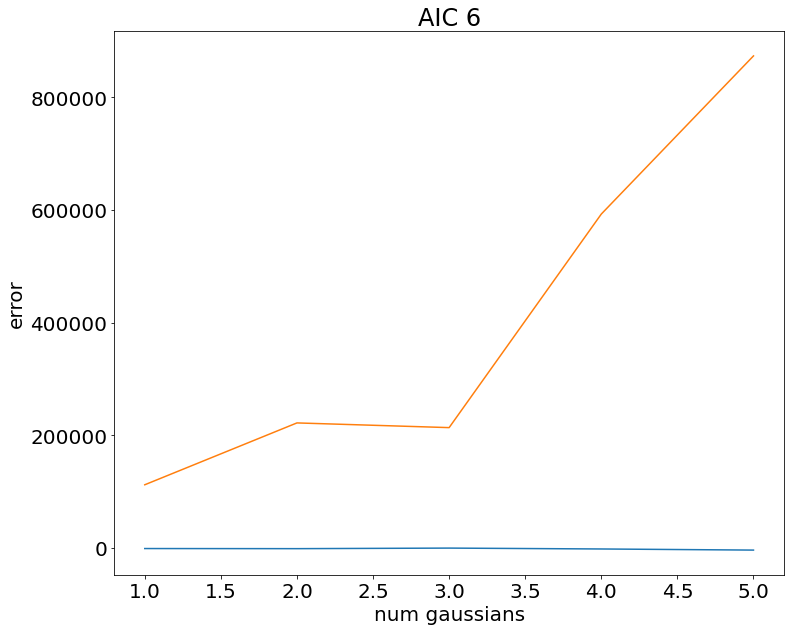

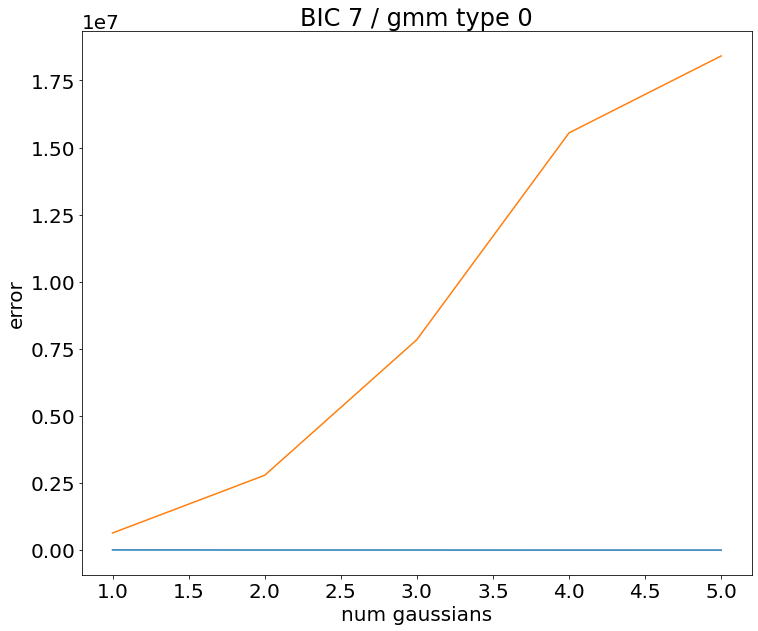

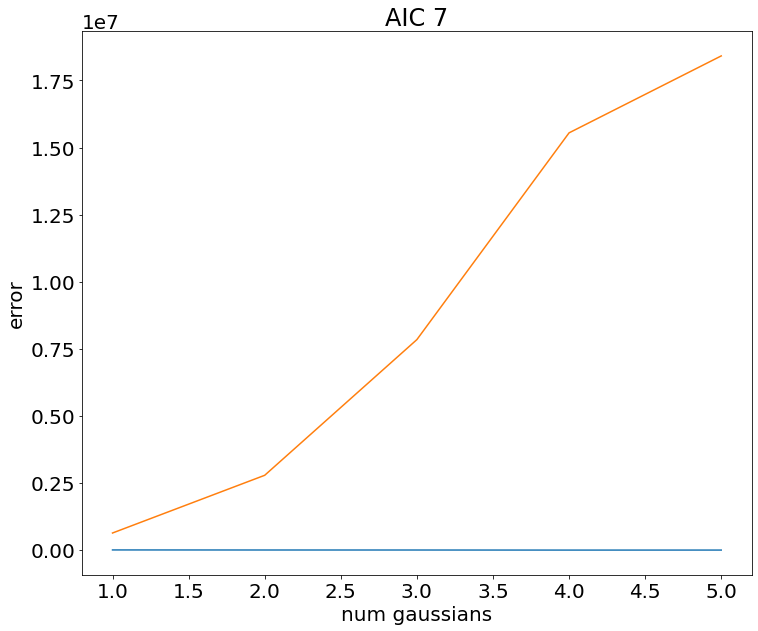

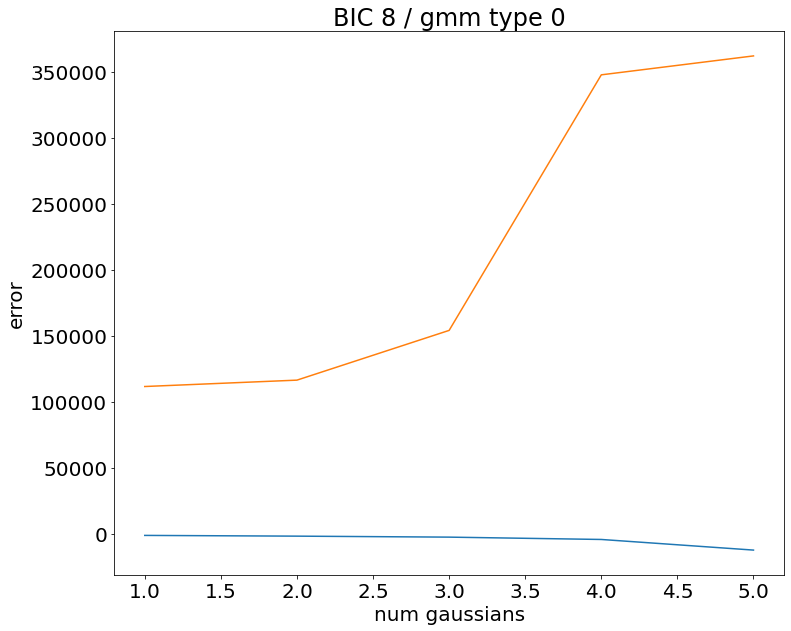

comix3 1


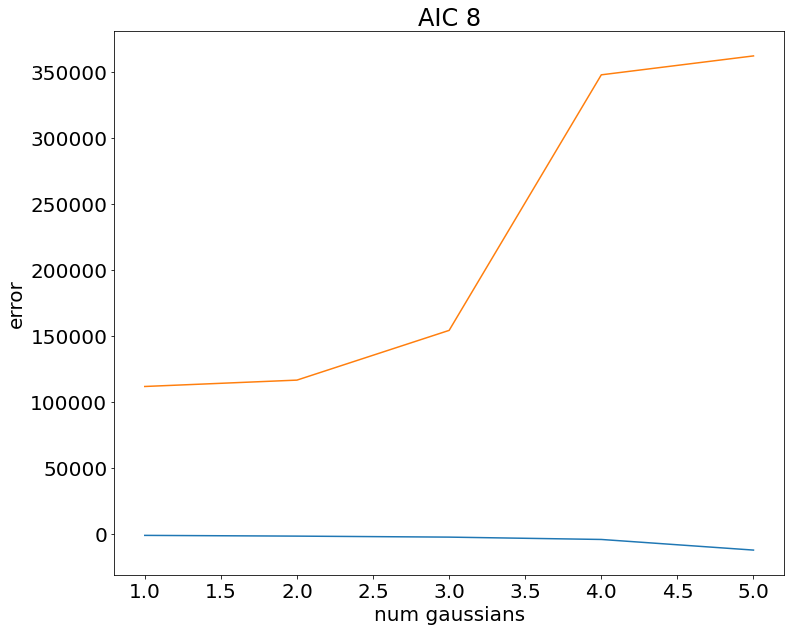

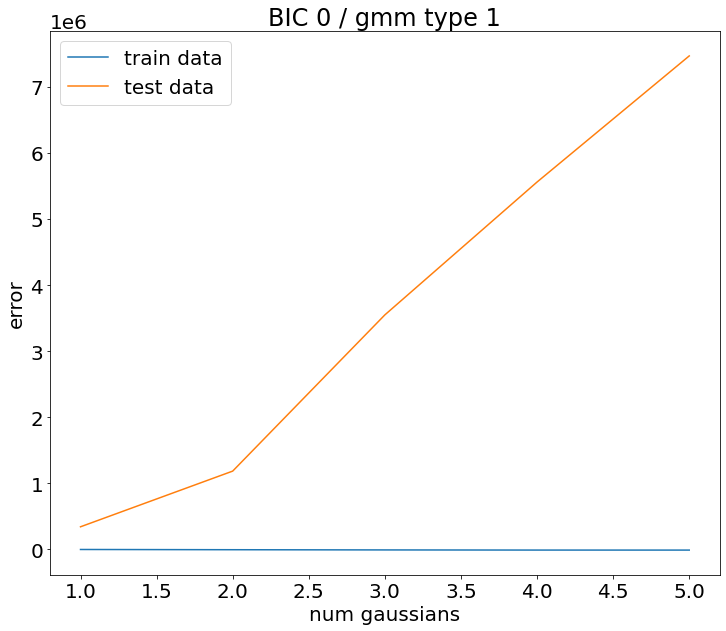

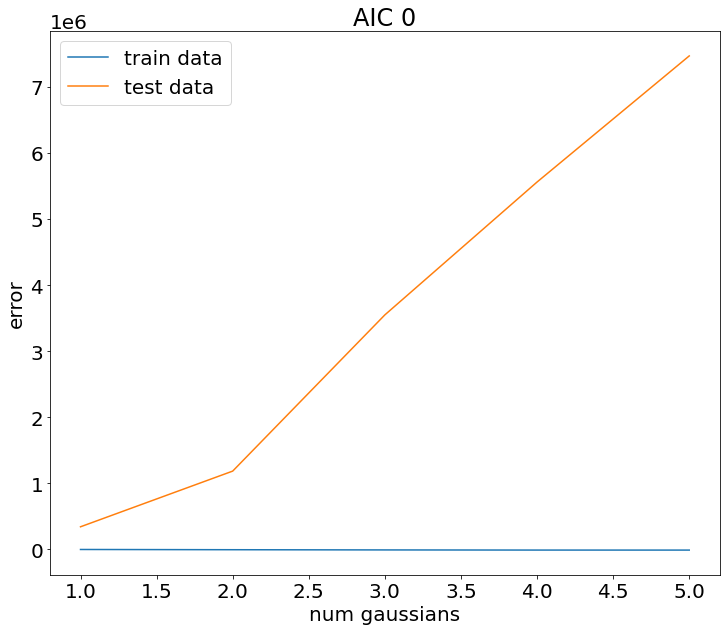

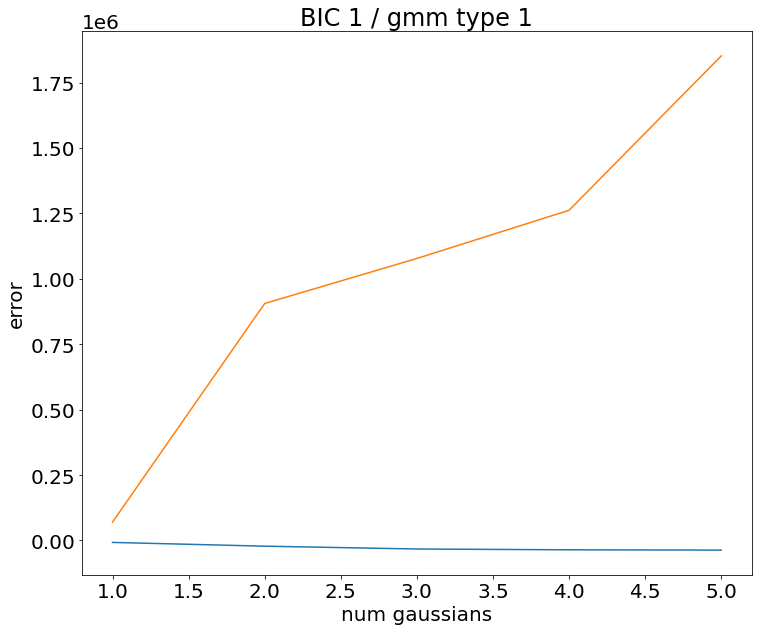

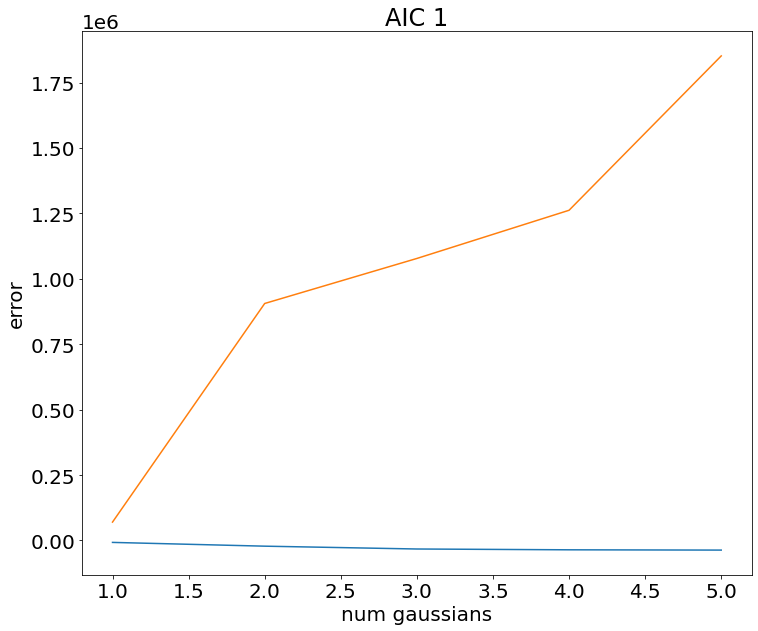

...

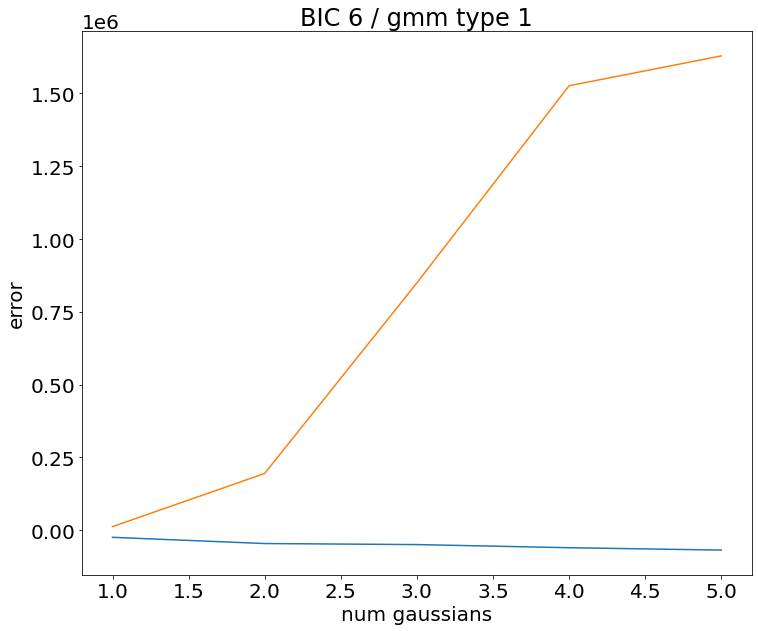

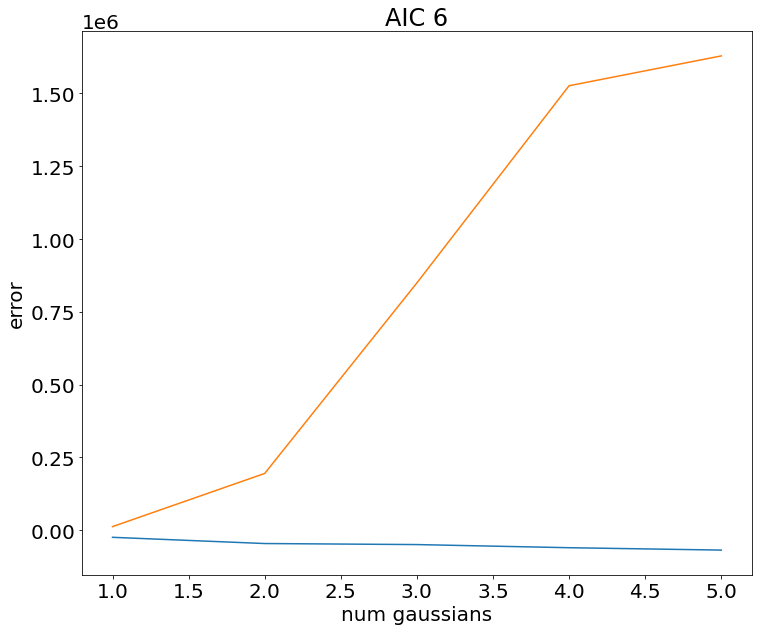

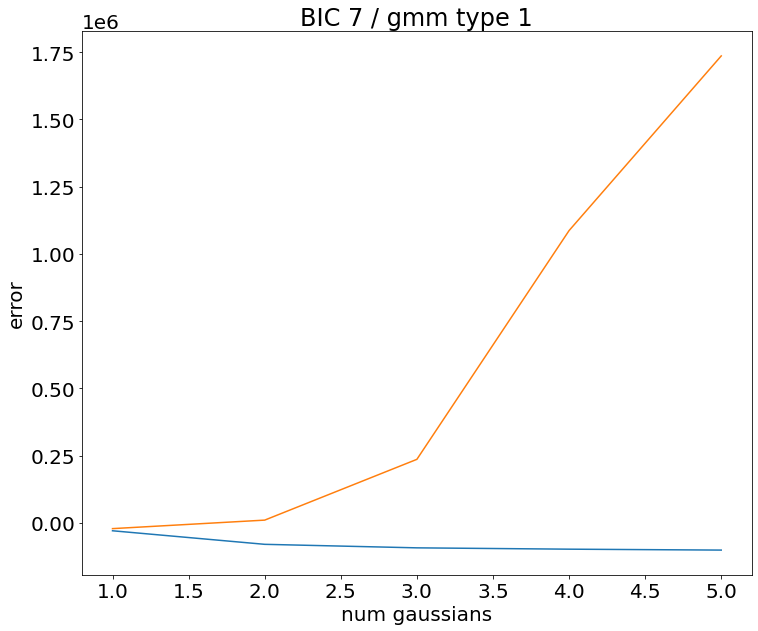

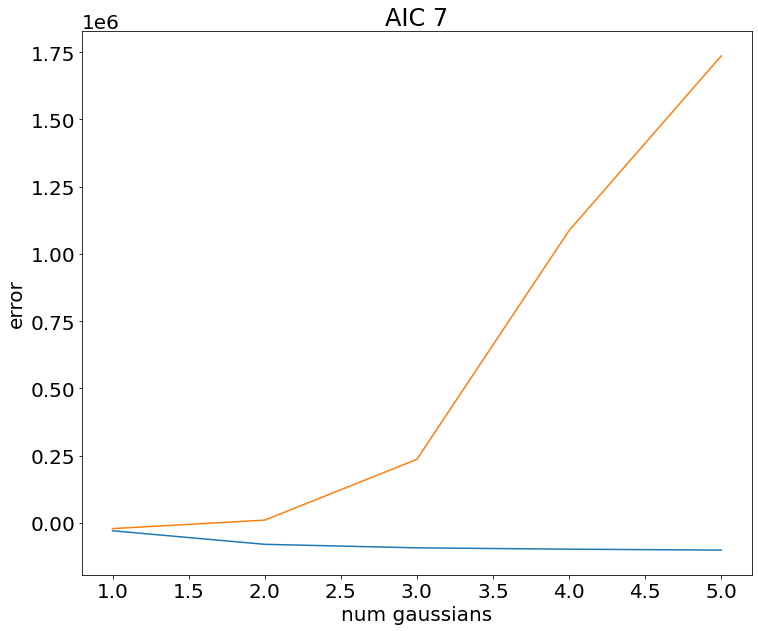

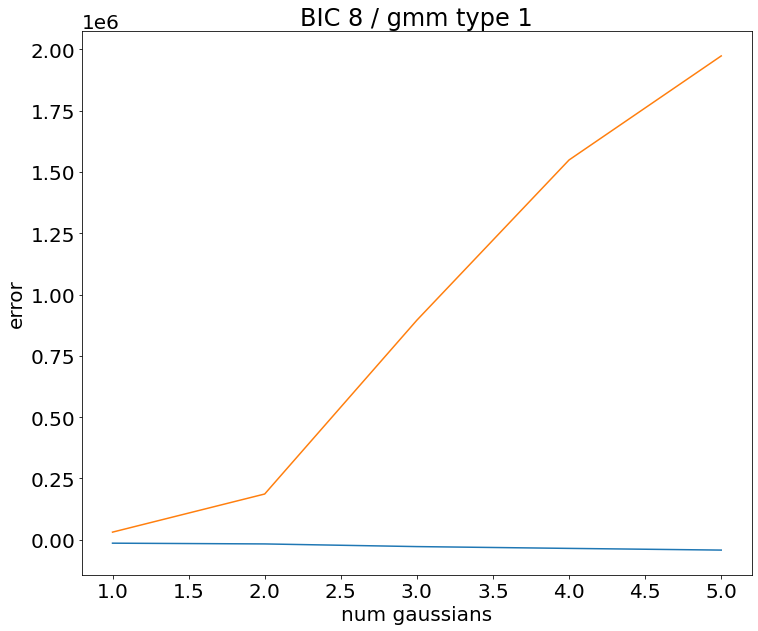

comix3 2


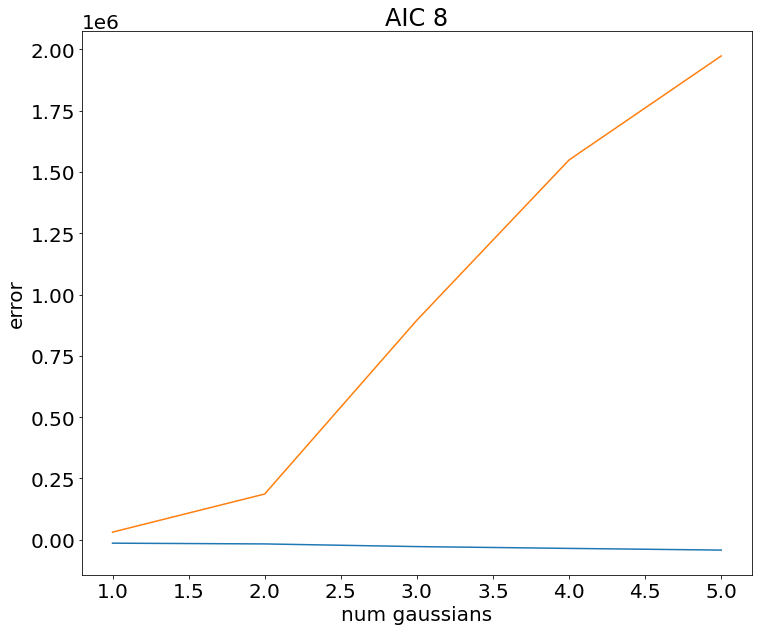

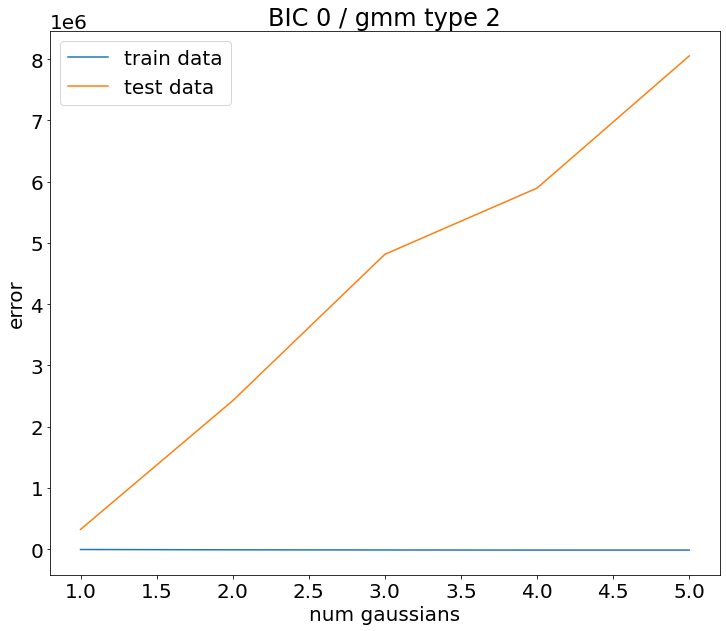

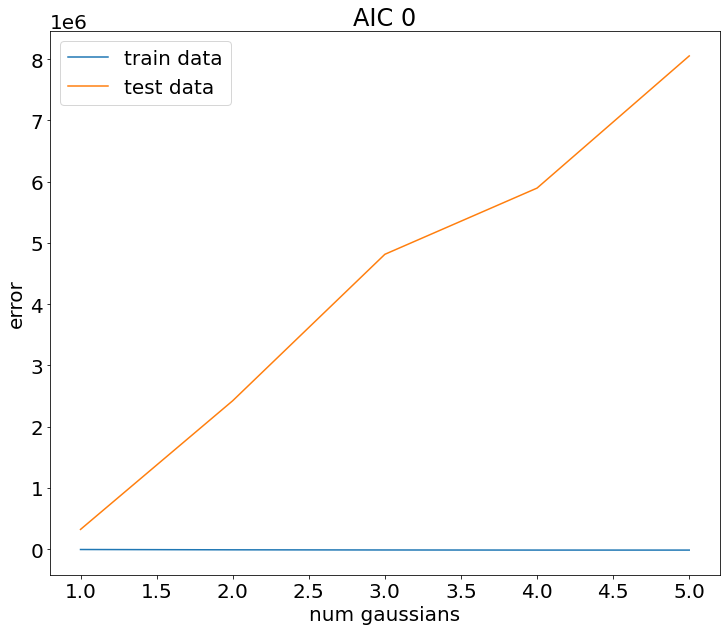

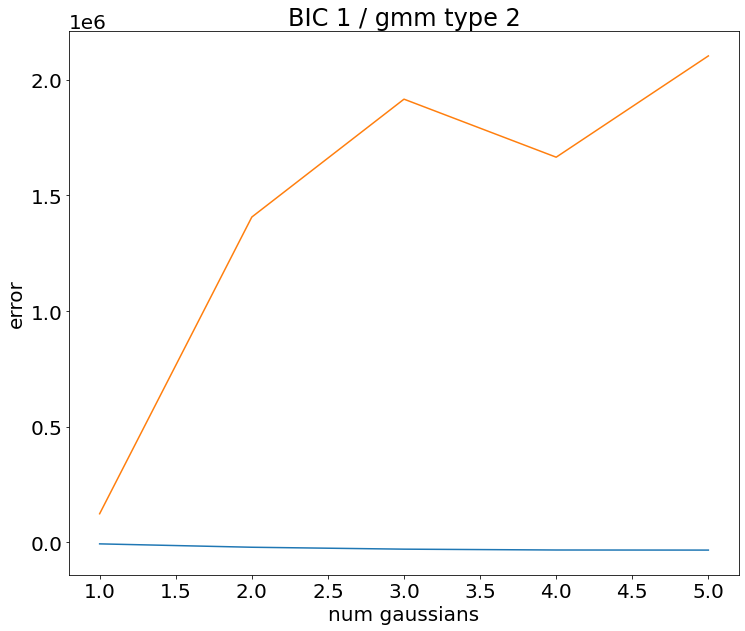

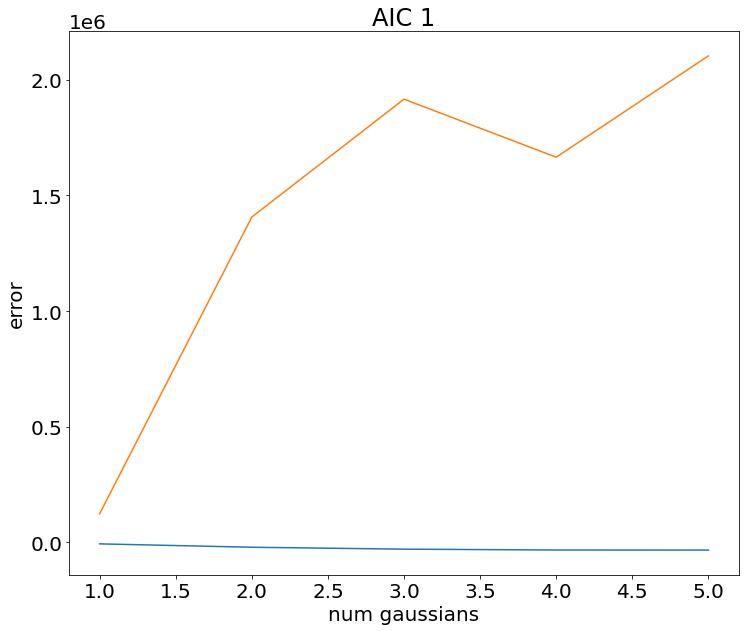

...

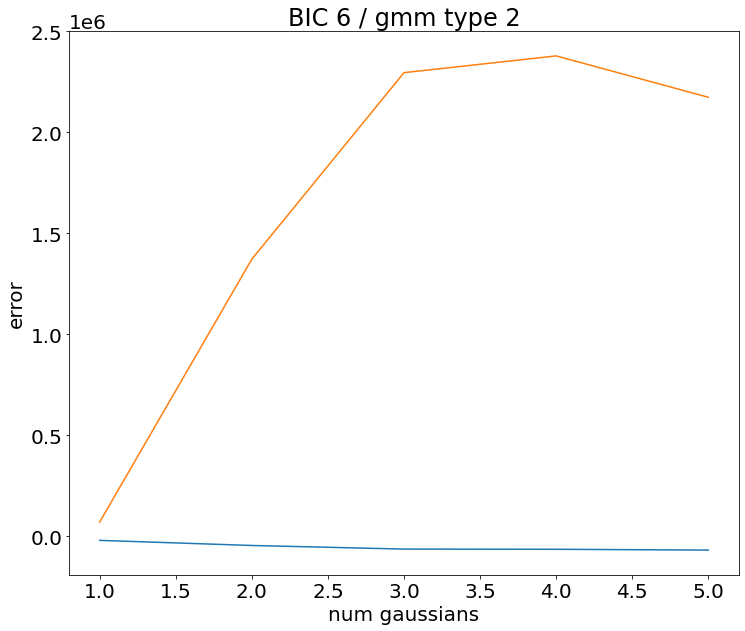

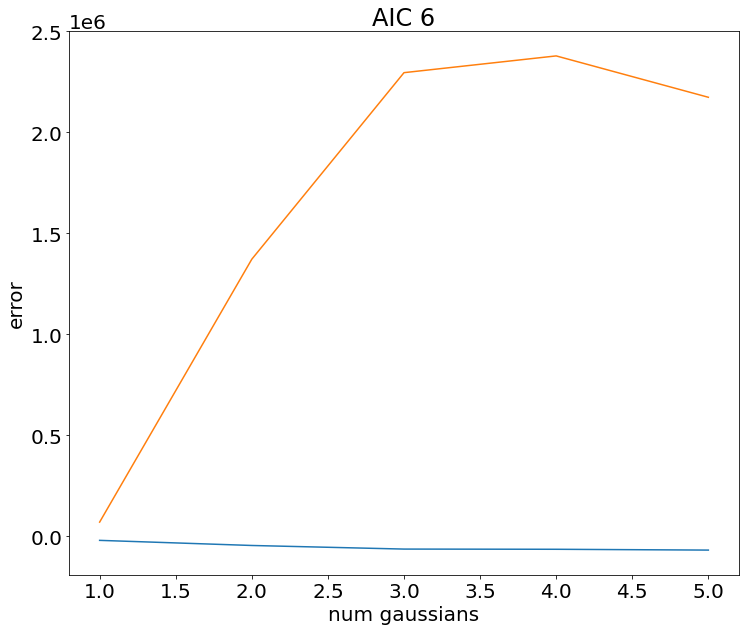

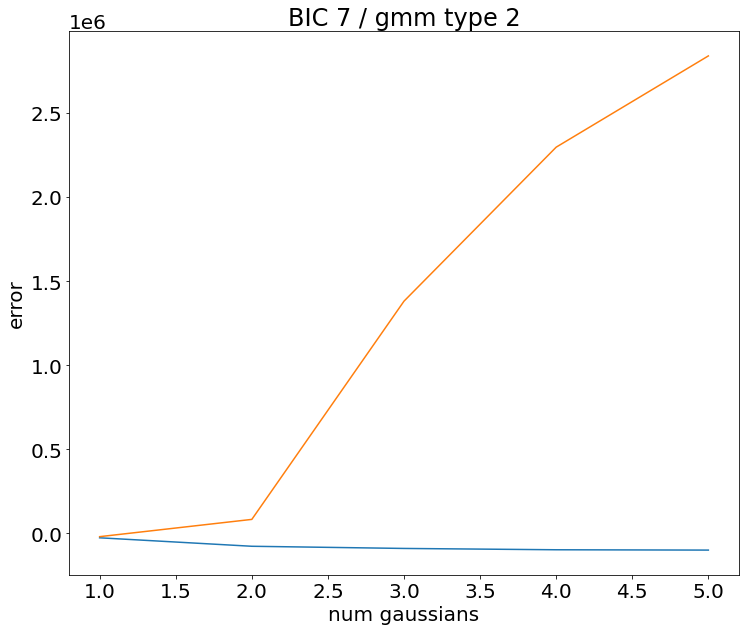

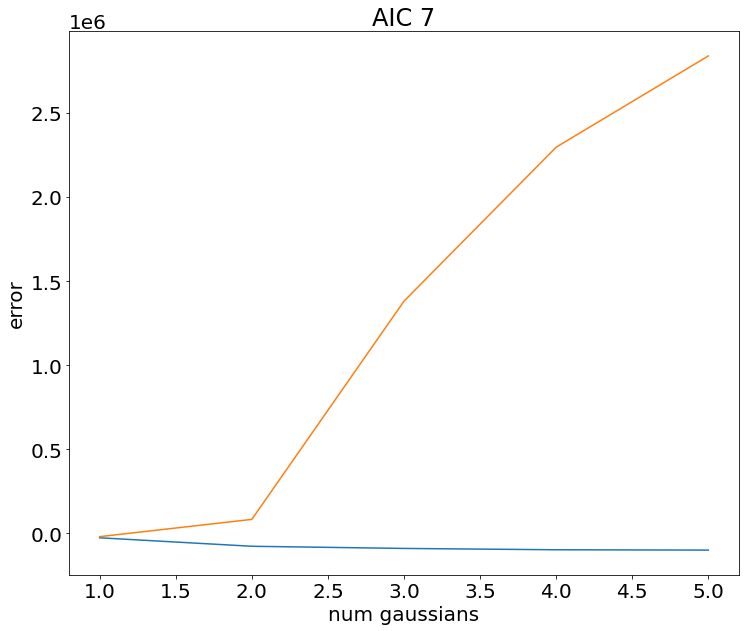

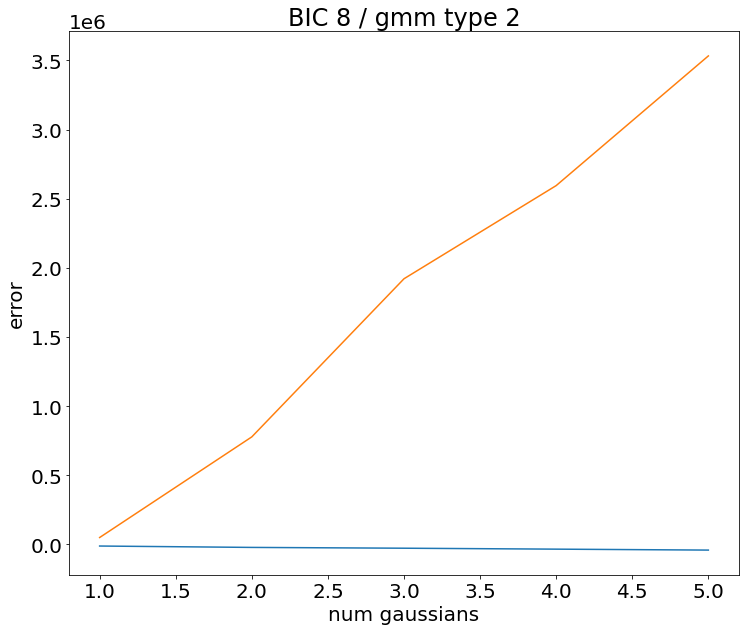

comix3 0
{'comix3': [1, 2, 1, 1, 1, 1, 1, 1, 1]}
comix3 1
{'comix3': [1, 1, 1, 2, 2, 2, 1, 2, 1]}
comix3 2
{'comix3': [1, 1, 1, 1, 1, 1, 1, 2, 1]}
{'comix3': [1, 1, 1, 1, 1, 1, 1, 2, 1]}
{'comix3': [1, 1, 1, 1, 1, 1, 1, 2, 1]}


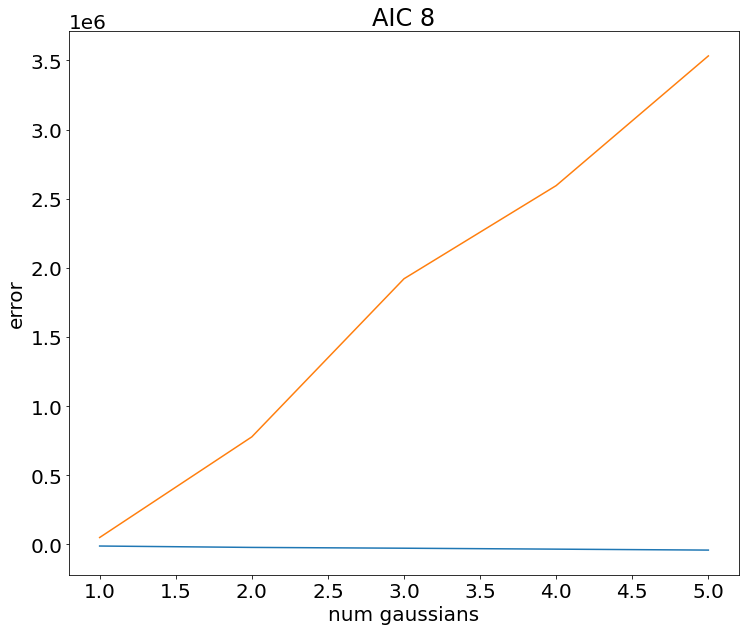

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import json
import math
import sklearn.mixture

# datas = ['comix3', 'comixa', 'comixb', 'comixc']
datas = ['comix3']
n = 100_000
max_comps = 6
buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]
plt.rcParams.update({'font.size': 20}) 

optimal_bic, optimal_aic = {}, {}
for data in datas:
    for model_num in range(3):
        optimal_aic[data]=[]; optimal_bic[data]=[]
        print(data, model_num)
        # ##################### read fits ####################################
        with open(f'../input_data/egos/{data}_dur.json', 'r') as f:
            egos = json.load(f)
        cm = np.genfromtxt(f'../input_data/contact_matrices/{data}_dur.csv', delimiter=',')
        # params = np.genfromtxt(f'data/params/params_{data}_dpln.csv', delimiter=',')
        
        ################ plot optimal number of components ###############
        # fig, ax = plt.subplots(3,3,figsize= (36,30))
        for age, _ in enumerate(partitions):
            egos_age = [a for a in egos if a['age'] == age]
            ## use log(k+1) instead of k to fit
            X = [[b if model_num == 0 else math.log(b+1) if model_num == 1 else math.sqrt(0 if math.log(b+1) < 0 else math.log(b+1)) for b in a['contacts']] for a in egos_age]
            ## split into training and testing data 
            # Generate random indices
            indices = np.arange(len(X))
            split_idx = int(0.8 * len(X))

            bic_scores = []

            # find optimal number of components
            for i in range(1,max_comps):
                bic_scores.append([])
                for j in range(100):
                    np.random.shuffle(indices)

                    # Split data
                    X_train = [X[i] for i in indices[:split_idx]]
                    X_test = [X[i] for i in indices[split_idx:]]
                    bic_scores[-1].append([0,0])
                    classifier = sklearn.mixture.GaussianMixture(n_components=i, covariance_type='full')
                    classifier.fit(X_train)
                    bic_scores[-1][-1][0] = classifier.bic(np.array(X_train))/4
                    bic_scores[-1][-1][1] = classifier.bic(np.array(X_test))
                
            with open(f'data/gmm_bic/{data}_BIC_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}.json', 'w') as f:
                json.dump(bic_scores, f)
            # try: 
            with open(f'data/gmm_bic/{data}_BIC_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}.json', 'r') as f:
                bic_scores = json.load(f)

            plt.figure(figsize=(12,10))
            plt.plot(list(range(1,max_comps)), [np.mean([b[0] for b in a]) for a in bic_scores], color='tab:blue', label='train data')
            plt.plot(list(range(1,max_comps)), [np.mean([b[1] for b in a]) for a in bic_scores], color='tab:orange', label='test data')
            plt.xlabel('num gaussians')
            plt.ylabel('error')
            if age==0:
                plt.legend()
            # plt.yscale('log')
            # plt.xscale('log')
            plt.title(f'BIC {age} / gmm type {model_num}')
            plt.show()
            
            test_vals = [np.median([b[1] for b in a]) for a in bic_scores]
            optimal_bic[data].append(int(np.argmin(test_vals))+1)
            
            #change bic to aic
            bic_scores = [[[b[0]-(num_comp+1)*np.log(float(len(egos_age)))+2*(num_comp+1),b[1]-(num_comp+1)*np.log(float(len(egos_age)))+2*(num_comp+1)] for b in a] for num_comp, a in enumerate(bic_scores)]
            plt.figure(figsize=(12,10))
            plt.plot(list(range(1,max_comps)), [np.mean([b[0] for b in a]) for a in bic_scores], color='tab:blue', label='train data')
            plt.plot(list(range(1,max_comps)), [np.mean([b[1] for b in a]) for a in bic_scores], color='tab:orange', label='test data')
            plt.xlabel('num gaussians')
            plt.ylabel('error')
            if age==0:
                plt.legend()
            # plt.yscale('log')
            # plt.xscale('log')
            plt.title(f'AIC {age}')
            # plt.show()
            
            test_vals = [np.median([b[1] for b in a]) for a in bic_scores]
            optimal_aic[data].append(int(np.argmin(test_vals))+1)
            # except: 
            #     a=1
            plt.savefig(f'figs/gmm_fits/{data}_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}.png')
            # plt.close()

# from the BIC scores get the minimum test val and use as the optimal num components in the model
datas = ['comix3','comixa', 'comixb', 'comixc']
n = 100_000
buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]
plt.rcParams.update({'font.size': 20}) 

optimal = {}
for data in [datas[0]]:
    for model_num in range(3):
        print(data, model_num)
        optimal[data] = []
        ################ plot optimal number of components ###############
        for age, _ in enumerate(partitions):
            with open(f'data/gmm_bic/{data}_BIC_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}.json', 'r') as f:
                bic_scores = json.load(f)
            test_vals = [np.median([b[1] for b in a]) for a in bic_scores]
            optimal[data].append(int(np.argmin(test_vals))+1)
        with open(f'data/gmm_opt_comp/optimal_components_{data}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}.json', 'w') as f:
            json.dump(optimal, f)
        print(optimal)
print(optimal_bic)
print(optimal_aic)

In [ ]:
try: 
    with open(f'data/gmm_bic/{data}_BIC_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}.json', 'r') as f:
        bic_scores = json.load(f)

    plt.figure(figsize=(12,10))
    plt.plot(list(range(1,16)), [np.mean([b[0] for b in a]) for a in bic_scores], color='tab:blue', label='train data')
    plt.plot(list(range(1,16)), [np.mean([b[1] for b in a]) for a in bic_scores], color='tab:orange', label='test data')
    plt.xlabel('num gaussians')
    plt.ylabel('error')
    if age==0:
        plt.legend()
    plt.show()
except: 
    a=1

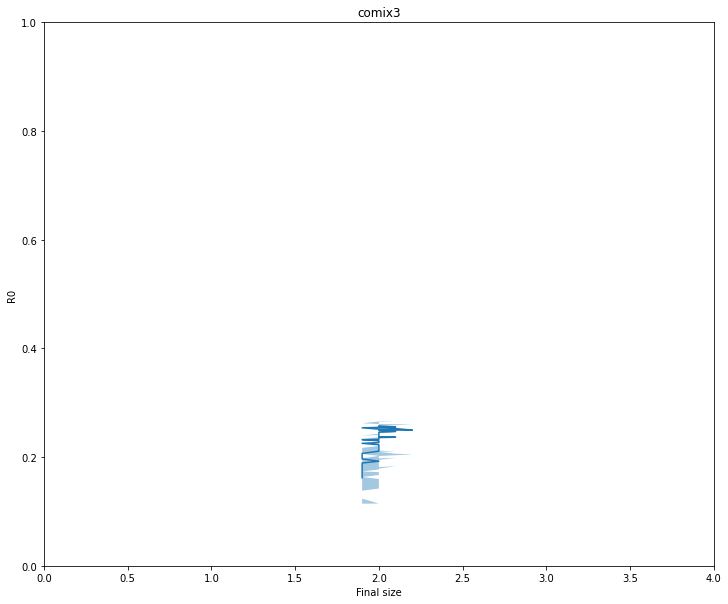

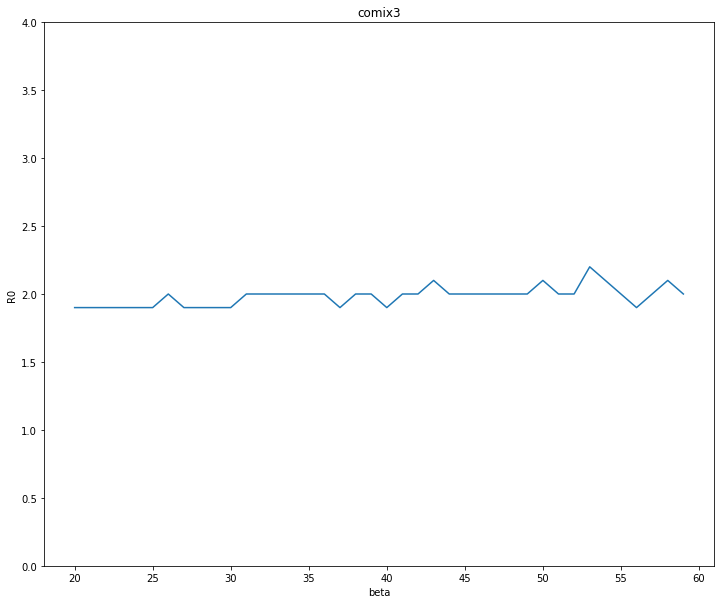

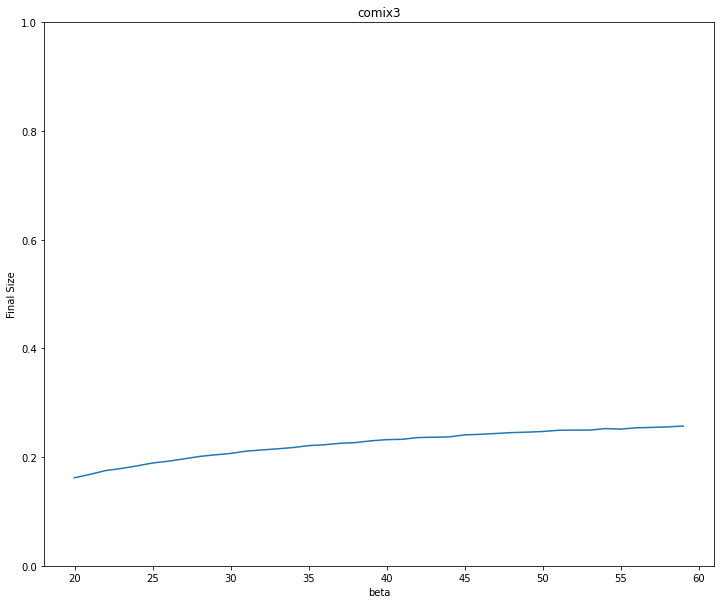

In [1]:
import json
import numpy as np
import matplotlib.pyplot as plt

fs, r0, taus = [], [], []
tau_to_index = {}
for k in range(30,36):
    with open(f'../output_data/gmm/duration_comix3_{k}.json', 'r') as f:
        res = json.load(f)
    for i,vec in enumerate(res['r0']):
        tau_val = res['taus'][i]
        if tau_val not in tau_to_index.keys():
            fs.append([]); r0.append([]); taus.append(res['taus'][i])
            tau_to_index[tau_val] = len(taus)-1
        ## use i as np.where taus == current tau
        idx = tau_to_index[tau_val]
        for j, val in enumerate(vec):
            if val != -1:
                r0[idx].append(val); 
            if res['fs'][i][j] != -1:
                fs[idx].append(res['fs'][i][j])

plt.figure(figsize=(12,10))
plt.plot([np.median(a) for a in r0 if len(a)>0], [np.median(a) for a in fs if len(a)>0])
plt.fill_between([np.median(a) for a in r0 if len(a)>0], [np.percentile(a,5) for a in fs if len(a)>0],[np.percentile(a,95) for a in fs if len(a)>0], alpha=0.4)
plt.xlabel('Final size')
plt.ylabel('R0')
plt.title('comix3')
plt.ylim(0,1)
plt.xlim(0,4)
plt.show()


plt.figure(figsize=(12,10))
plt.plot([a for i,a in enumerate(taus) if len(r0[i]) > 0], [np.median(a) for a in r0 if len(a)>0])
plt.xlabel('beta')
plt.ylabel('R0')
plt.title('comix3')
plt.ylim(0,4)
plt.show()

plt.figure(figsize=(12,10))
plt.plot([a for i,a in enumerate(taus) if len(r0[i]) > 0], [np.median(a) for a in fs if len(a)>0])
plt.xlabel('beta')
plt.ylabel('Final Size')
plt.title('comix3')
plt.ylim(0,1)
plt.show()



## Look at the histograms for each age group after gmm fit

### Log

0
1
2
3
4
5
6
7
8


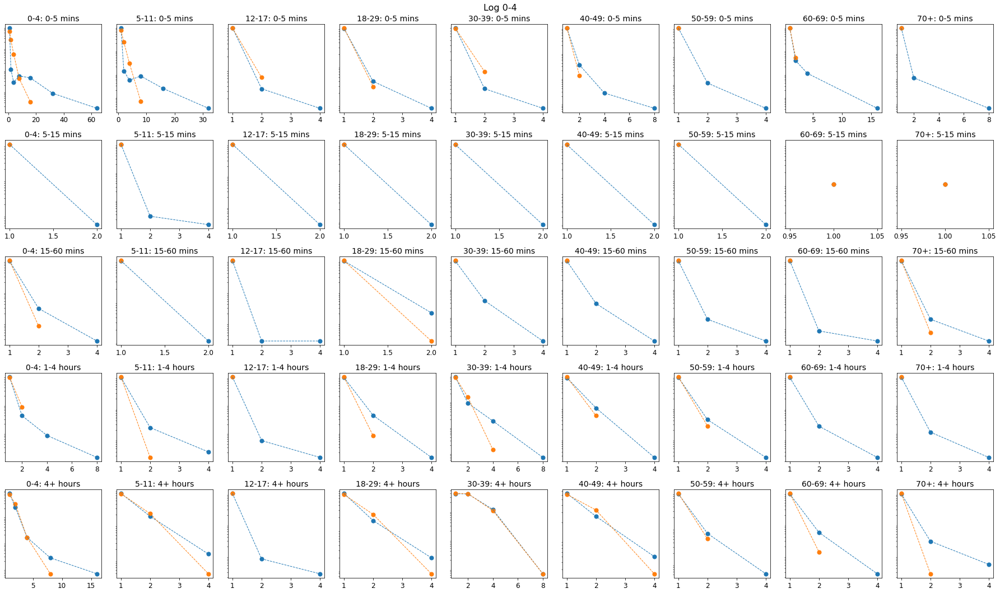

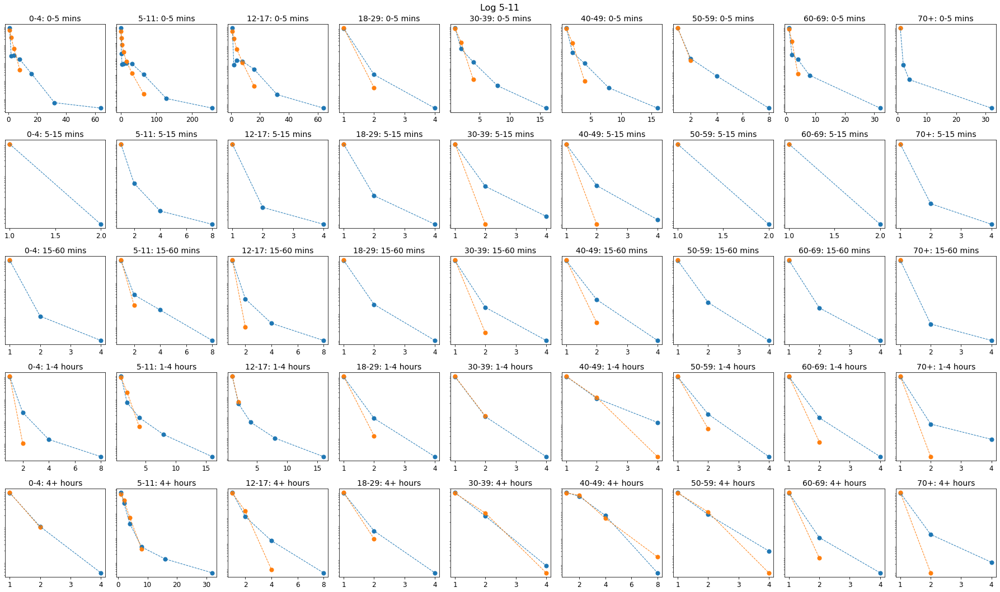

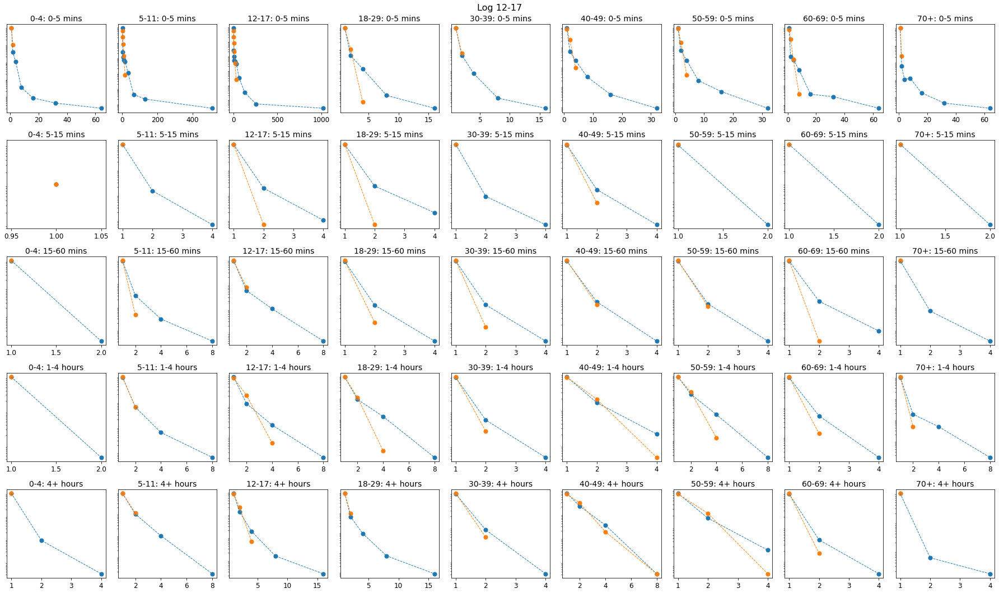

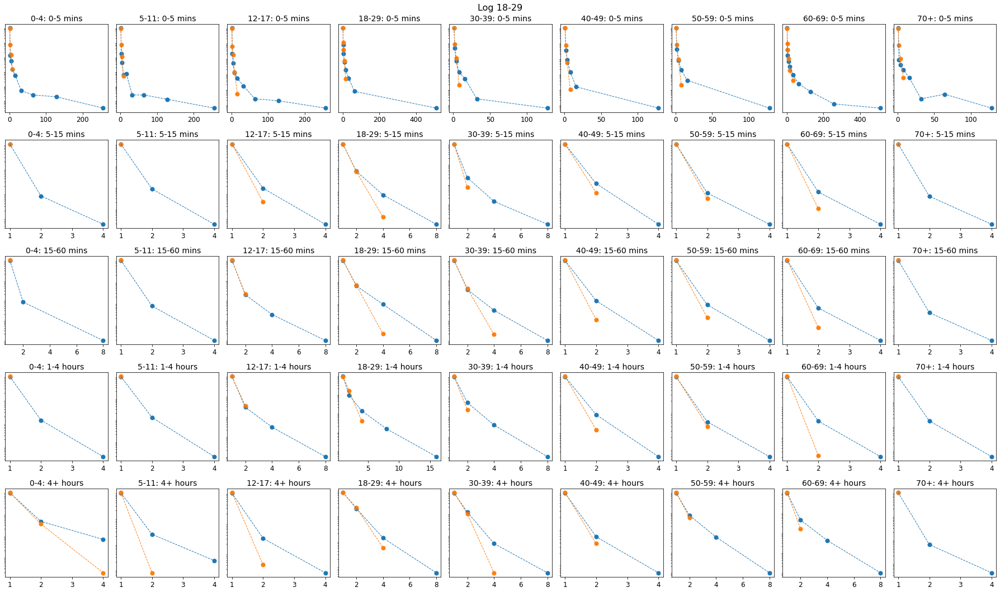

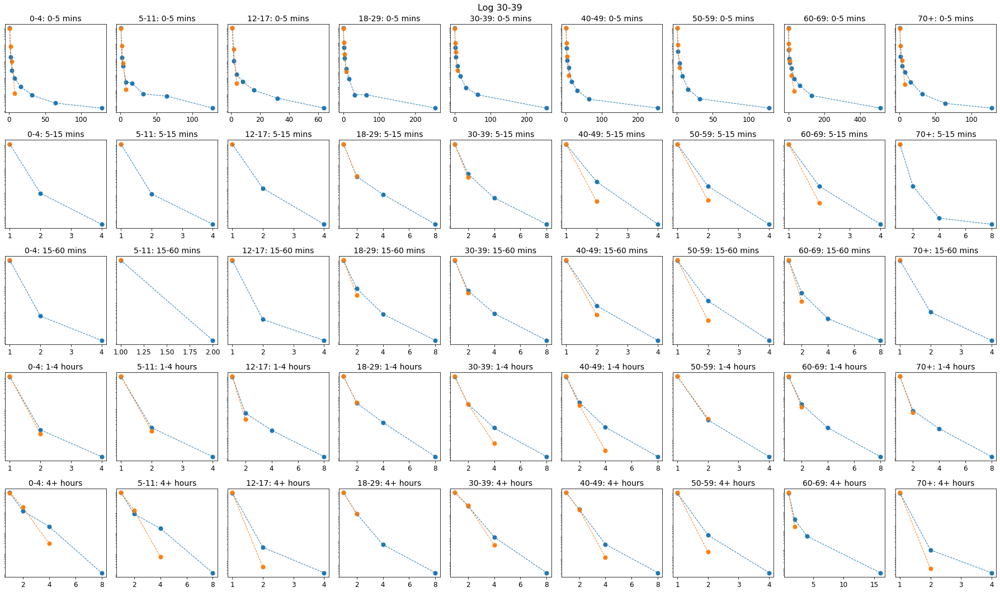

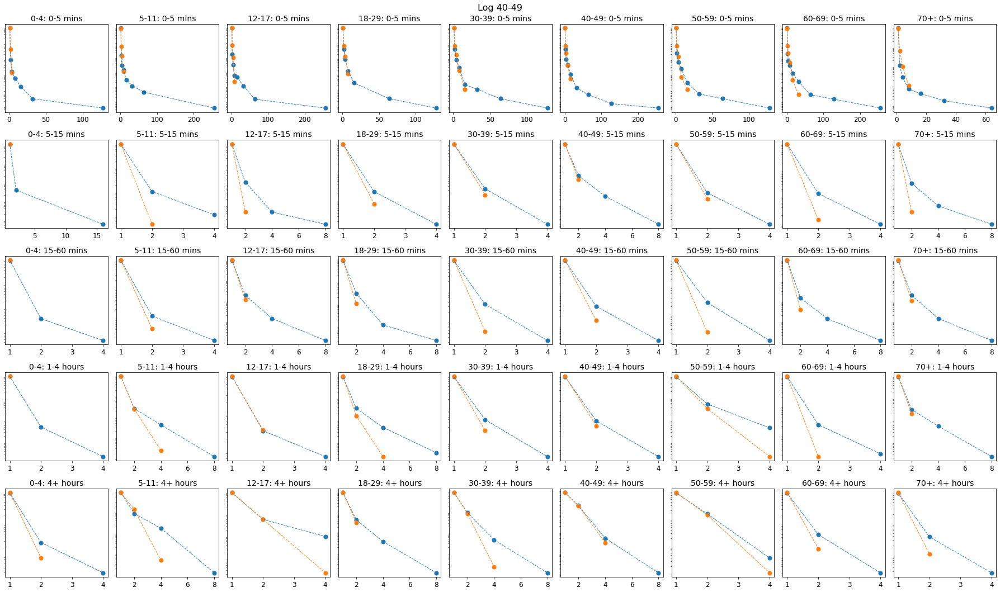

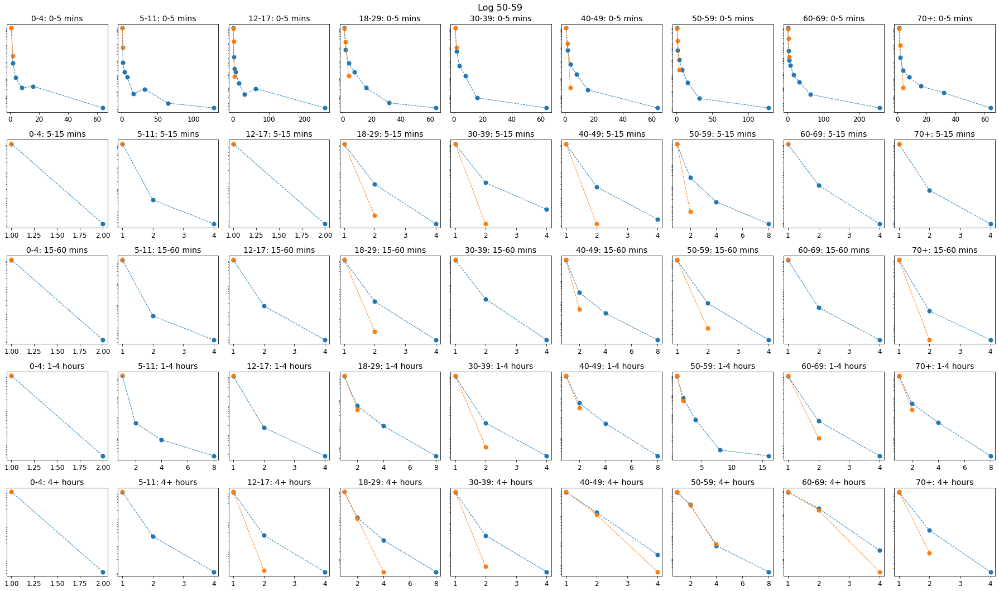

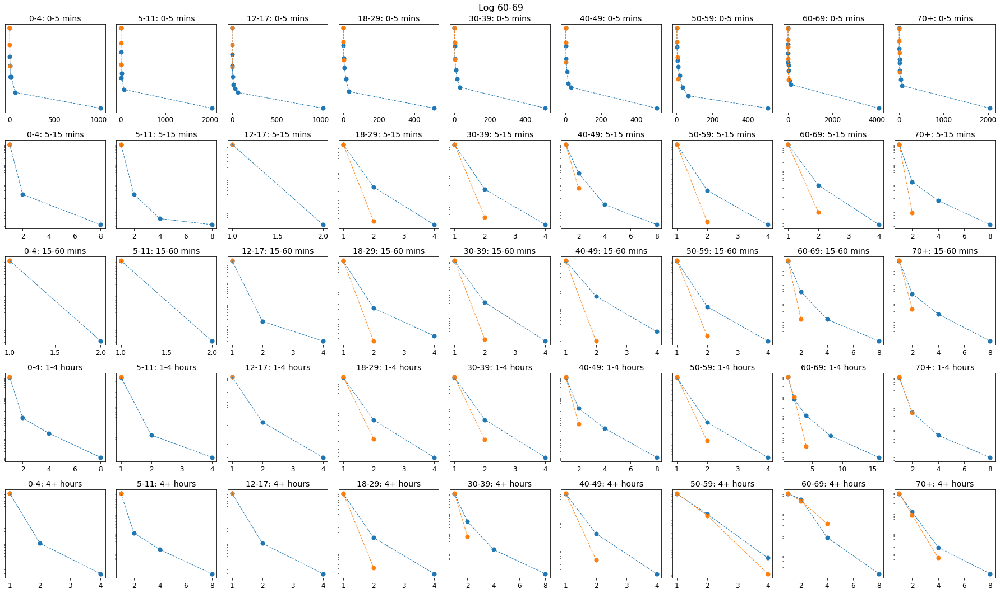

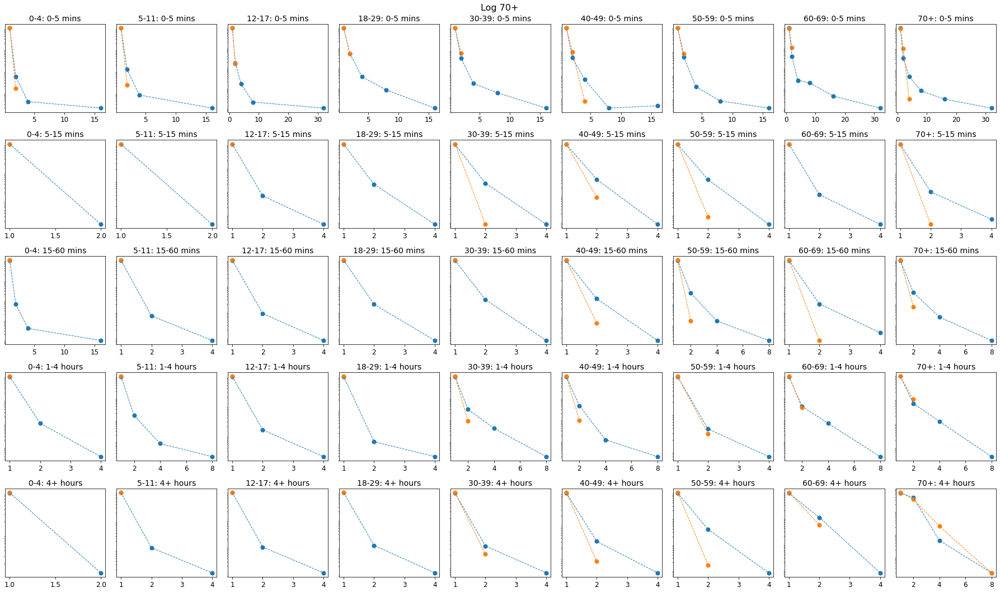

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import json
import math
import scipy as sc
import sklearn.mixture
plt.rcParams.update({'font.size': 12})


data = 'comix3'
bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-5 mins', '5-15 mins', '15-60 mins', '1-4 hours', '4+ hours']
with open(f'data/gmm_opt_comp/optimal_components_{data}_log.json', 'r') as f:
    optimal_num_components = json.load(f)
##################### read fits ####################################
with open(f'../input_data/egos/{data}_dur.json', 'r') as f:
    egos = json.load(f)

classifier = []
samples = []
samples_for_plot = []
# for l, _ in enumerate(partitions):
## l = which age group we are looking at
per_partition = [100_000 for _ in bucket_labels]
n_rows, n_cols = 5, 9  # subplot grid per figure
for l, _ in enumerate(bucket_labels):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 15))
    fig.suptitle(f"Log {bucket_labels[l]}", fontsize=16) 
    # axes is a 2D array [row, col], so flatten for easy iteration
    # axes = axes.flatten()
    samples_for_plot.append([])
    classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
    egos_age = [a for a in egos if a['age'] == l]
    ## use log(k+1) instead of k to fit
    X = [[math.log(b+1) for b in a['contacts']] for a in egos_age]
    classifier[l].fit(X)
    ## sample same number of people as the data
    samples_tmp,_ = classifier[l].sample(len(egos_age))
    for sample in samples_tmp:
        samples.append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        samples_for_plot[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        
    

    for d in range(len(samples[0])):
        # plt.figure(figsize=(12,10))
        tmp_egos = [a['contacts'][d] for a in egos_age]
        max_val = max(tmp_egos)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_egos, bins,density=True)
        # y,x = np.histogram(tmp_egos, list(range(int(max(tmp_egos))+1)),density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        # plt.scatter(x,y, label='Data',s=150)
        # plt.plot(x,y,'--',linewidth=2)
        
        axes[d%5][d//5].scatter(x,y, label='Data',s=50,color='tab:blue')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:blue')
        
        tmp_gmm = [a[d] for a in samples_for_plot[l]]
        max_val = max(tmp_gmm)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_gmm, bins,density=True)
        # y,x = np.histogram(tmp_gmm, list(range(max(tmp_gmm)+1)),density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        # plt.scatter(x,y, label='GMM',s=150)
        # plt.plot(x,y,'--',linewidth=2)

        axes[d%5][d//5].scatter(x,y, label='GMM',s=50, color='tab:orange')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:orange')
        
        # plt.title(f'{bucket_labels[l]} with {bucket_labels[d//5]} : {duration_labels[d%5]}')
        # plt.yscale('log')
        # # plt.xscale('log')
        # # plt.ylim(ylims)
        # plt.xlabel('Degree')
        # plt.ylabel('Density')
        # plt.legend()
        # plt.savefig(f'figs/gmm_dd/{bucket_labels[l]}_to_{bucket_labels[d//5]}_dur_{d%5}')
        # plt.show()
        
        axes[d%5][d//5].set_yscale('log')
        axes[d%5][d//5].set_title(f"{bucket_labels[d//5]}: {duration_labels[d%5]}", fontsize=14)
        # axes[d%5][d//5].set_xticks([])
        axes[d%5][d//5].set_yticks([])
        
    plt.tight_layout()
    fig.savefig(f'figs/gmm_dd/big_{l}_log', )
    print(l)    

### Normal

0
1
2
3
4
5
6
7
8


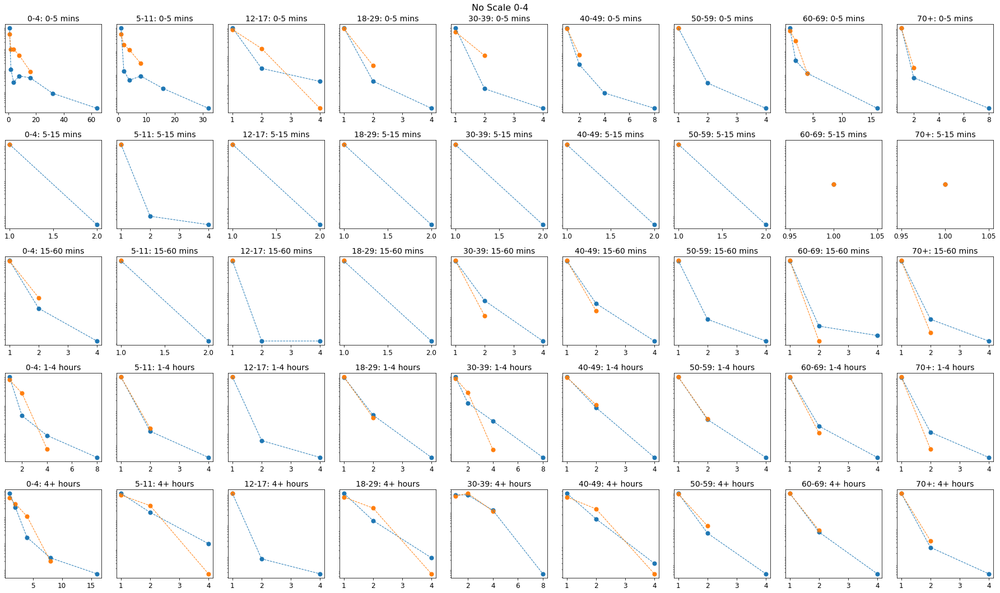

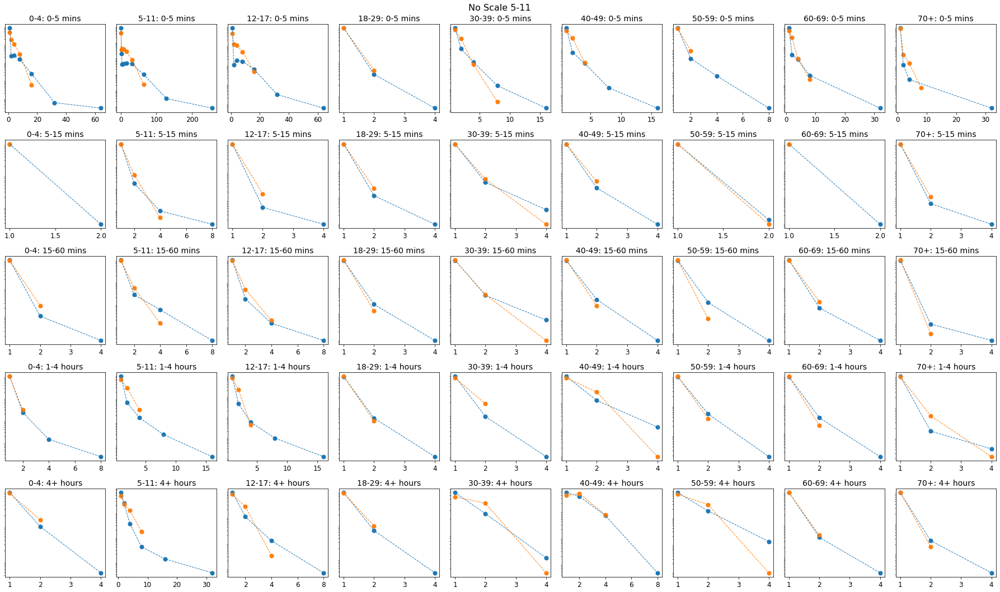

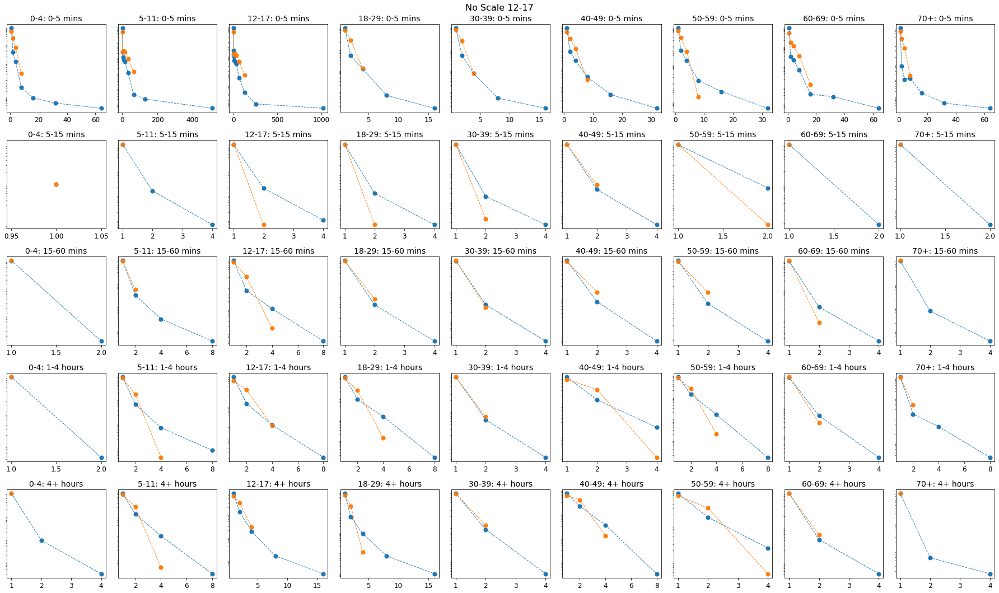

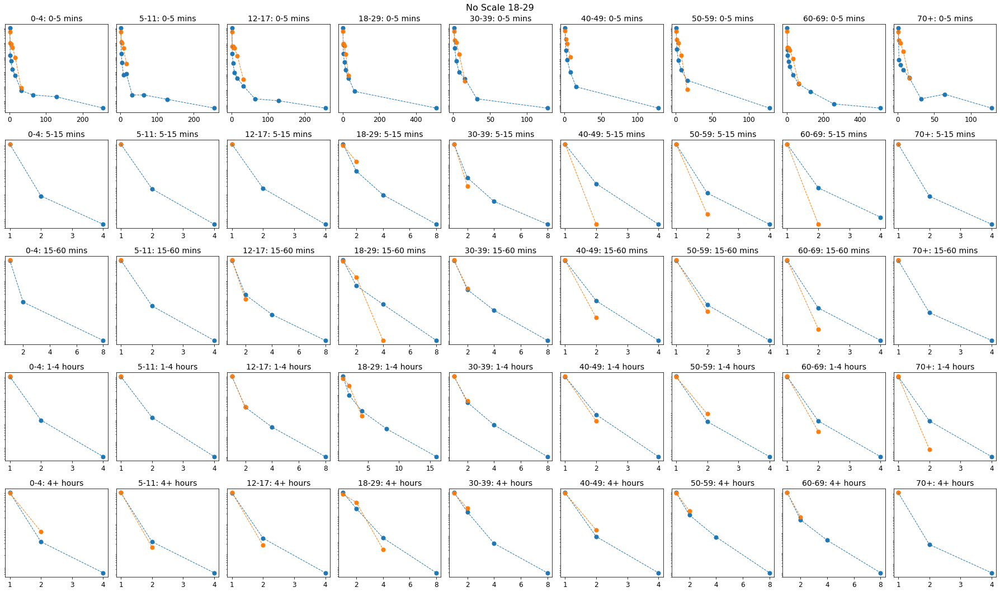

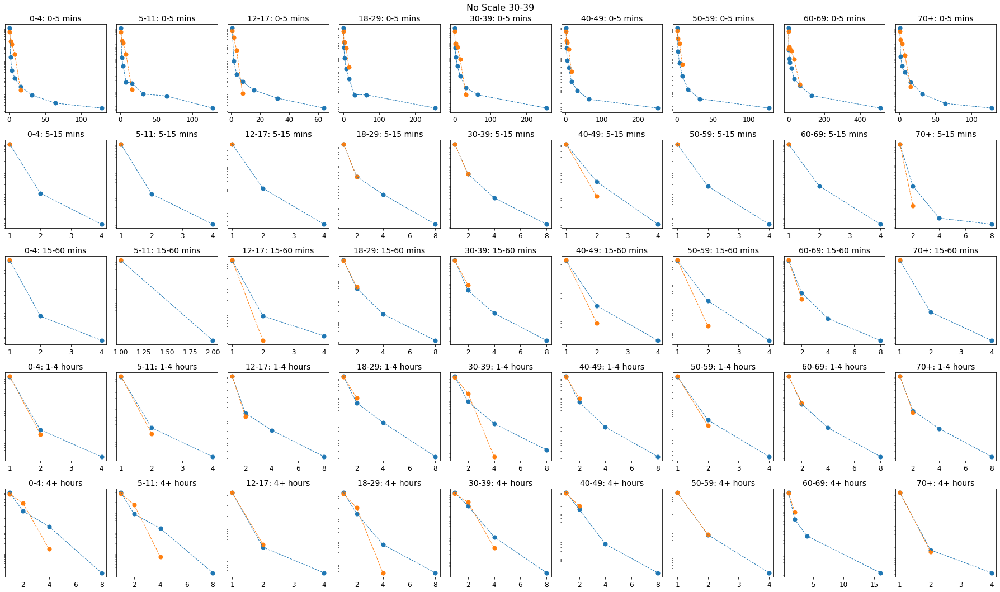

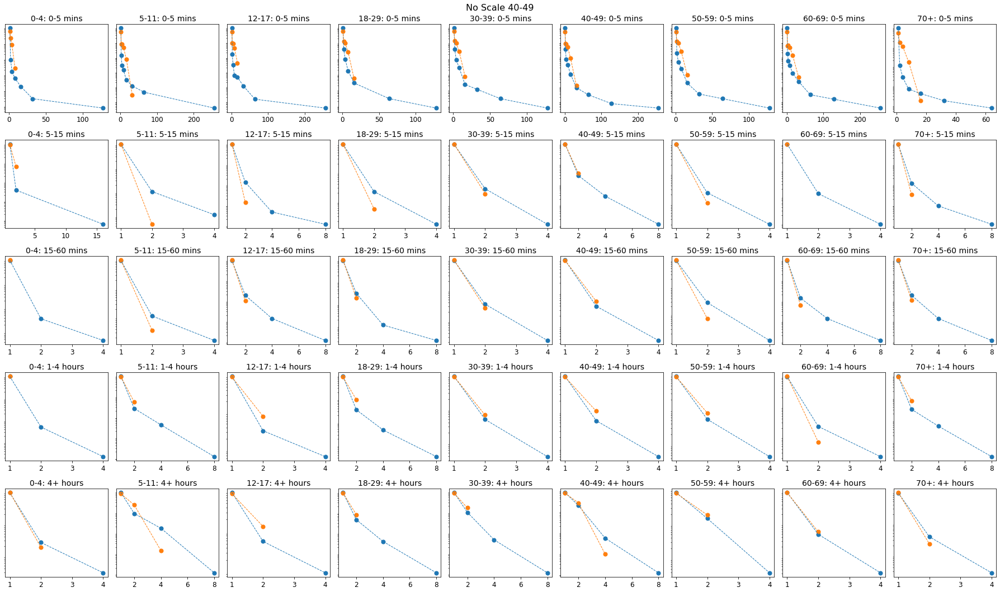

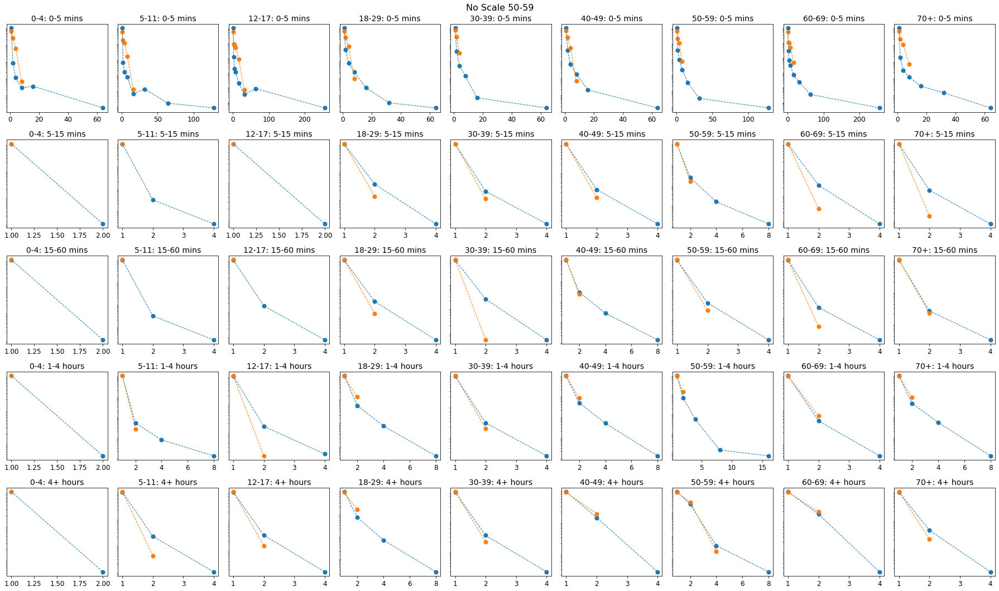

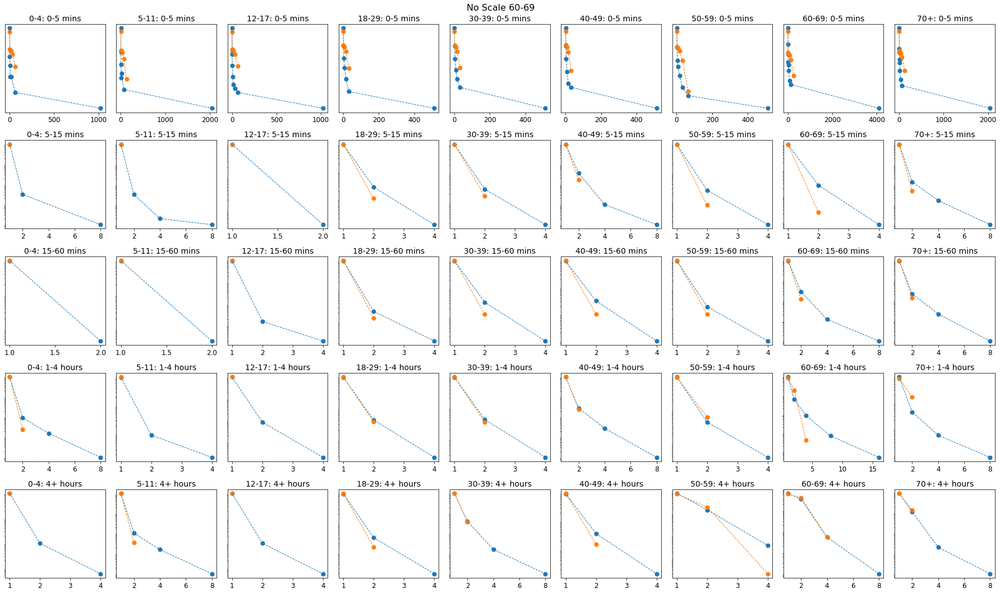

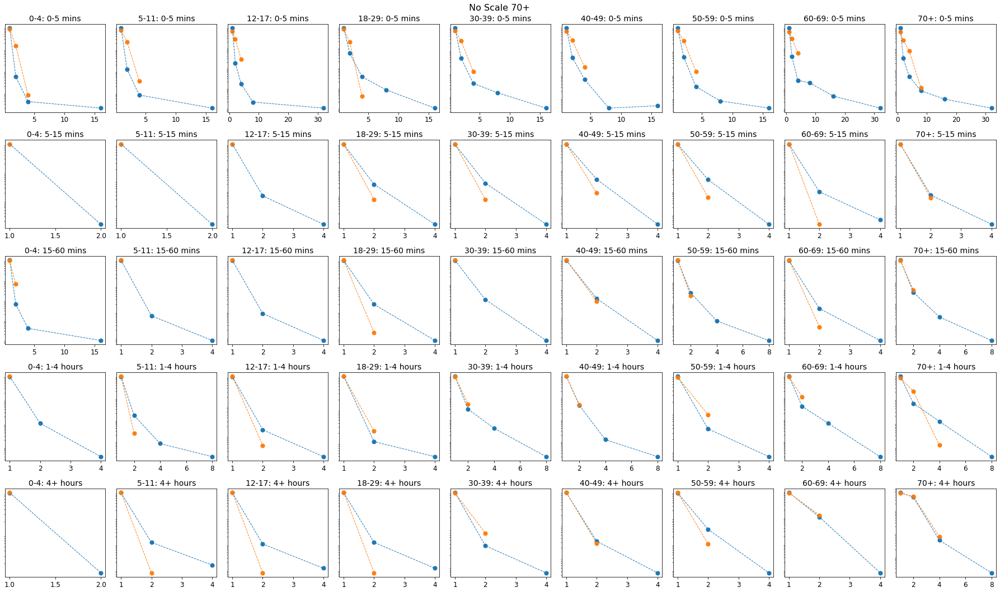

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import json
import math
import scipy as sc
import sklearn.mixture
plt.rcParams.update({'font.size': 12})


data = 'comix3'
bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-5 mins', '5-15 mins', '15-60 mins', '1-4 hours', '4+ hours']
with open(f'data/gmm_opt_comp/optimal_components_{data}_none.json', 'r') as f:
    optimal_num_components = json.load(f)
##################### read fits ####################################
with open(f'../input_data/egos/{data}_dur.json', 'r') as f:
    egos = json.load(f)

classifier = []
samples = []
samples_for_plot = []
# for l, _ in enumerate(partitions):
## l = which age group we are looking at
per_partition = [100_000 for _ in bucket_labels]
n_rows, n_cols = 5, 9  # subplot grid per figure
for l, _ in enumerate(bucket_labels):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 15))
    fig.suptitle(f"No Scale {bucket_labels[l]}", fontsize=16) 
    # axes is a 2D array [row, col], so flatten for easy iteration
    # axes = axes.flatten()
    samples_for_plot.append([])
    classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
    egos_age = [a for a in egos if a['age'] == l]
    ## use log(k+1) instead of k to fit
    X = [[b for b in a['contacts']] for a in egos_age]
    classifier[l].fit(X)
    ## sample same number of people as the data
    samples_tmp,_ = classifier[l].sample(len(egos_age))
    for sample in samples_tmp:
        samples.append([int(np.round(b)) if int(np.round(b))>=0 else 0 for b in sample])
        samples_for_plot[-1].append([int(np.round(b)) if int(np.round(b))>=0 else 0 for b in sample])


    for d in range(len(samples[0])):
        # plt.figure(figsize=(12,10))
        tmp_egos = [a['contacts'][d] for a in egos_age]
        max_val = max(tmp_egos)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_egos, bins,density=True)
        # y,x = np.histogram(tmp_egos, list(range(int(max(tmp_egos))+1)),density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        # plt.scatter(x,y, label='Data',s=150)
        # plt.plot(x,y,'--',linewidth=2)
        
        axes[d%5][d//5].scatter(x,y, label='Data',s=50,color='tab:blue')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:blue')
        
        tmp_gmm = [a[d] for a in samples_for_plot[l]]
        max_val = max(tmp_gmm)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_gmm, bins,density=True)
        # y,x = np.histogram(tmp_gmm, list(range(max(tmp_gmm)+1)),density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        # plt.scatter(x,y, label='GMM',s=150)
        # plt.plot(x,y,'--',linewidth=2)

        axes[d%5][d//5].scatter(x,y, label='GMM',s=50, color='tab:orange')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:orange')
        
        # plt.title(f'{bucket_labels[l]} with {bucket_labels[d//5]} : {duration_labels[d%5]}')
        # plt.yscale('log')
        # # plt.xscale('log')
        # # plt.ylim(ylims)
        # plt.xlabel('Degree')
        # plt.ylabel('Density')
        # plt.legend()
        # plt.savefig(f'figs/gmm_dd/{bucket_labels[l]}_to_{bucket_labels[d//5]}_dur_{d%5}')
        # plt.show()
        
        axes[d%5][d//5].set_yscale('log')
        axes[d%5][d//5].set_title(f"{bucket_labels[d//5]}: {duration_labels[d%5]}", fontsize=14)
        # axes[d%5][d//5].set_xticks([])
        axes[d%5][d//5].set_yticks([])
        
    plt.tight_layout()
    fig.savefig(f'figs/gmm_dd/big_{l}_none', )
    print(l)    

### sqrt

0
1
2
3
4
5
6
7
8


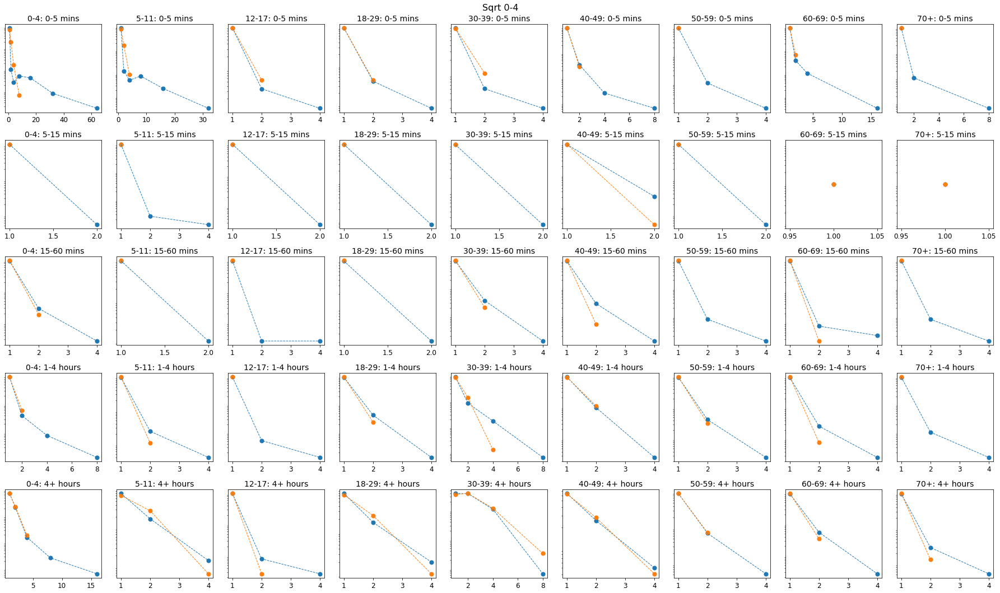

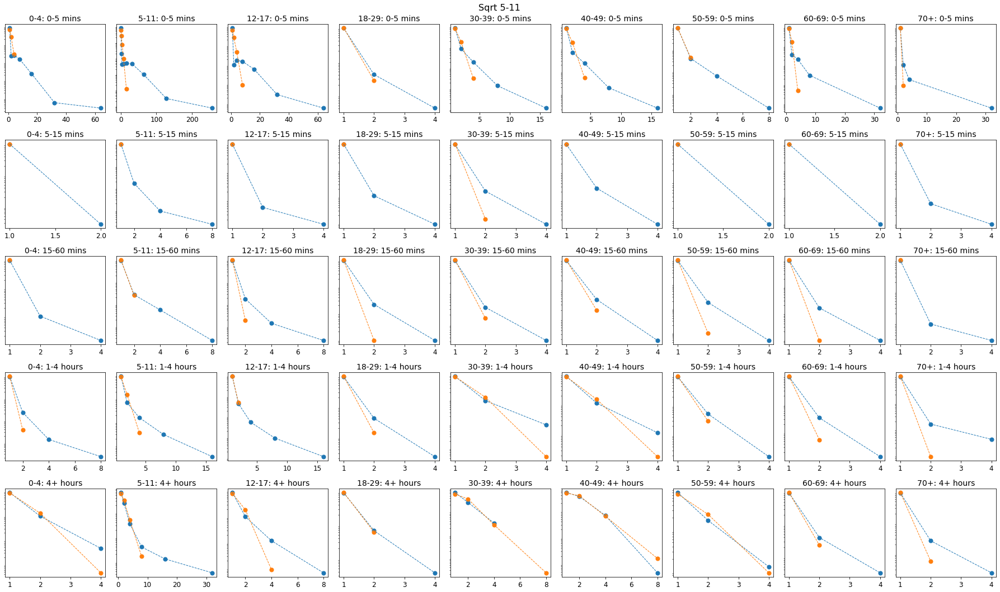

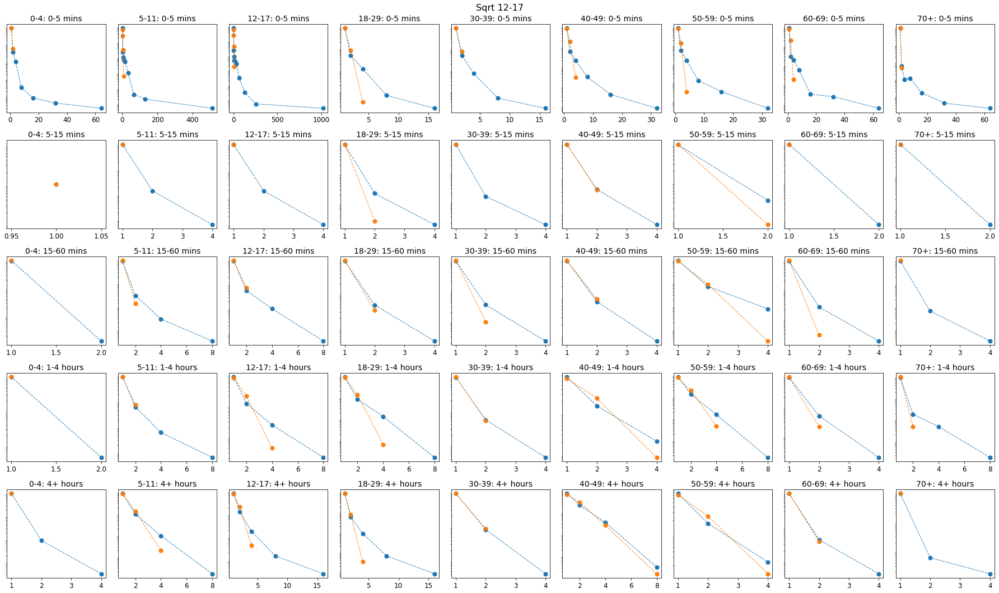

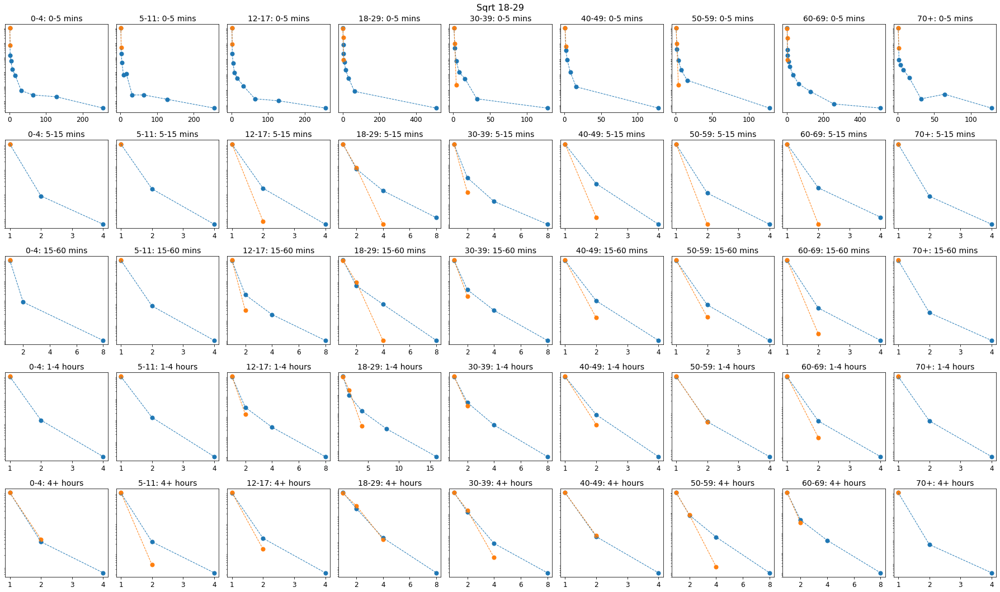

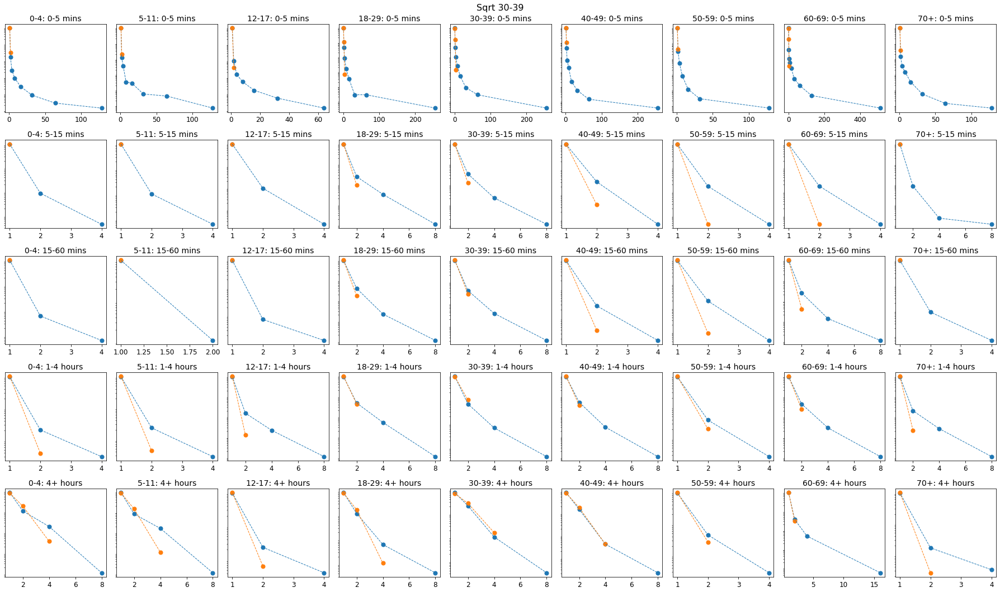

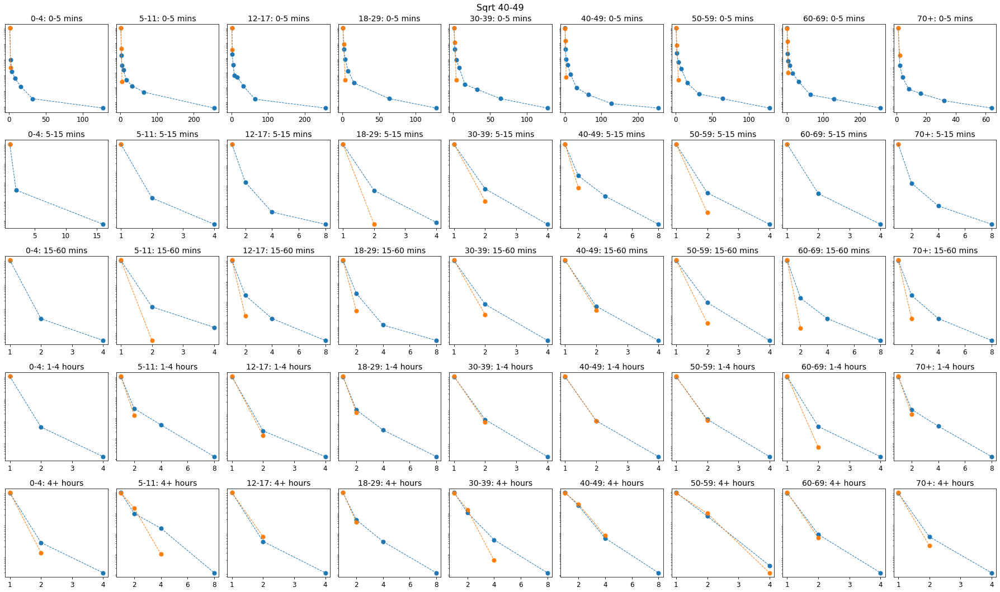

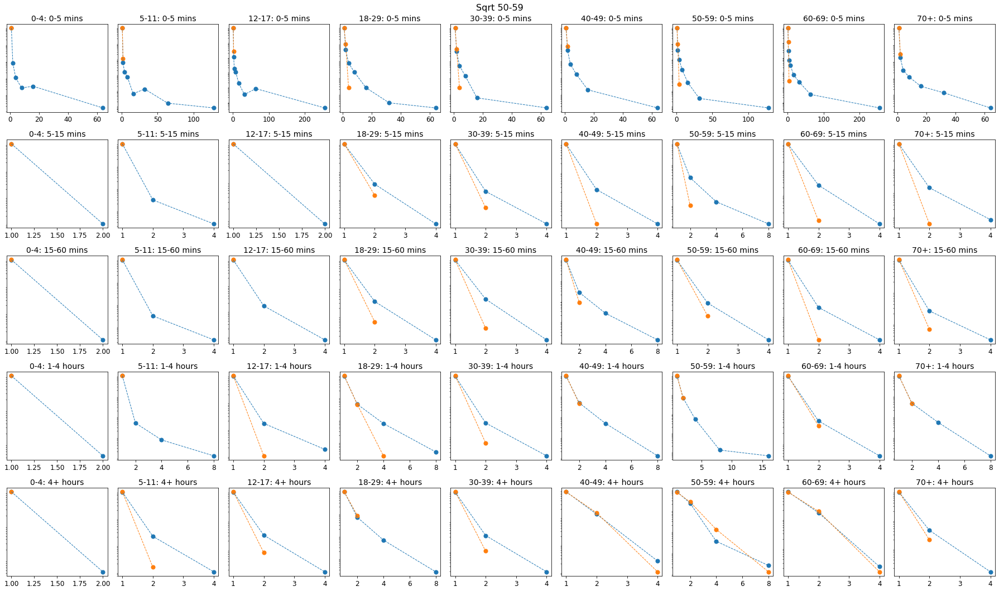

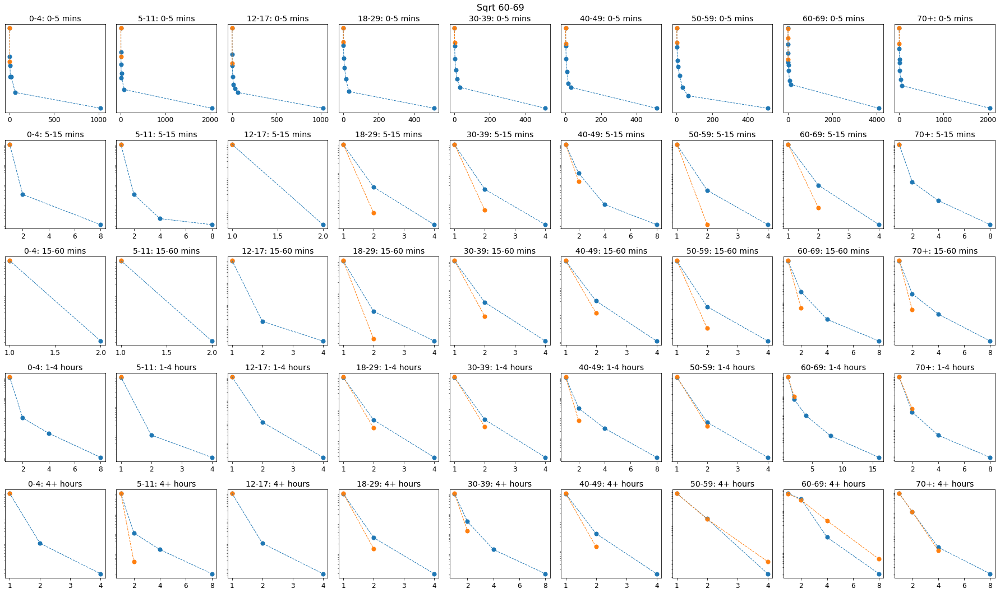

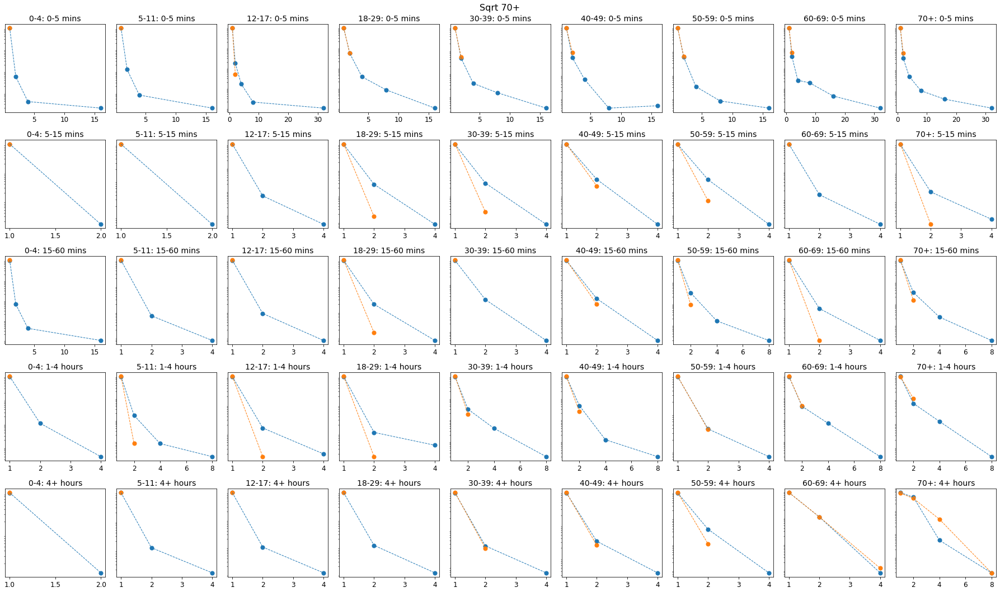

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import json
import math
import scipy as sc
import sklearn.mixture
plt.rcParams.update({'font.size': 12})


data = 'comix3'
bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-5 mins', '5-15 mins', '15-60 mins', '1-4 hours', '4+ hours']
with open(f'data/gmm_opt_comp/optimal_components_{data}_sqrt.json', 'r') as f:
    optimal_num_components = json.load(f)
##################### read fits ####################################
with open(f'../input_data/egos/{data}_dur.json', 'r') as f:
    egos = json.load(f)

classifier = []
samples = []
samples_for_plot = []
# for l, _ in enumerate(partitions):
## l = which age group we are looking at
# per_partition = [100_000 for _ in bucket_labels]
n_rows, n_cols = 5, 9  # subplot grid per figure
for l, _ in enumerate(bucket_labels):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 15))
    fig.suptitle(f"Sqrt {bucket_labels[l]}", fontsize=16) 
    # axes is a 2D array [row, col], so flatten for easy iteration
    # axes = axes.flatten()
    samples_for_plot.append([])
    classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
    egos_age = [a for a in egos if a['age'] == l]
    ## use log(k+1) instead of k to fit
    X = [[math.sqrt(0 if math.log(b+1) < 0 else math.log(b+1)) for b in a['contacts']] for a in egos_age]
    classifier[l].fit(X)
    ## sample same number of people as the data
    samples_tmp,_ = classifier[l].sample(len(egos_age))
    for sample in samples_tmp:
        samples.append([int(np.round(np.exp(b**2)-1)) if int(np.round(np.exp(b**2)-1))>=0 else 0 for b in sample])
        samples_for_plot[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        
    

    for d in range(len(samples[0])):
        # plt.figure(figsize=(12,10))
        tmp_egos = [a['contacts'][d] for a in egos_age]
        max_val = max(tmp_egos)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_egos, bins,density=True)
        # y,x = np.histogram(tmp_egos, list(range(int(max(tmp_egos))+1)),density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        # plt.scatter(x,y, label='Data',s=150)
        # plt.plot(x,y,'--',linewidth=2)
        
        axes[d%5][d//5].scatter(x,y, label='Data',s=50,color='tab:blue')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:blue')
        
        tmp_gmm = [a[d] for a in samples_for_plot[l]]
        max_val = max(tmp_gmm)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_gmm, bins,density=True)
        # y,x = np.histogram(tmp_gmm, list(range(max(tmp_gmm)+1)),density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        # plt.scatter(x,y, label='GMM',s=150)
        # plt.plot(x,y,'--',linewidth=2)

        axes[d%5][d//5].scatter(x,y, label='GMM',s=50, color='tab:orange')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:orange')
        
        # plt.title(f'{bucket_labels[l]} with {bucket_labels[d//5]} : {duration_labels[d%5]}')
        # plt.yscale('log')
        # # plt.xscale('log')
        # # plt.ylim(ylims)
        # plt.xlabel('Degree')
        # plt.ylabel('Density')
        # plt.legend()
        # plt.savefig(f'figs/gmm_dd/{bucket_labels[l]}_to_{bucket_labels[d//5]}_dur_{d%5}')
        # plt.show()
        
        axes[d%5][d//5].set_yscale('log')
        axes[d%5][d//5].set_title(f"{bucket_labels[d//5]}: {duration_labels[d%5]}", fontsize=14)
        # axes[d%5][d//5].set_xticks([])
        axes[d%5][d//5].set_yticks([])
        
    plt.tight_layout()
    fig.savefig(f'figs/gmm_dd/big_{l}_sqrt')
    print(l)    

### model and netwrok

100000 100000 100000
0
1
2
3
4
5
6
7
8


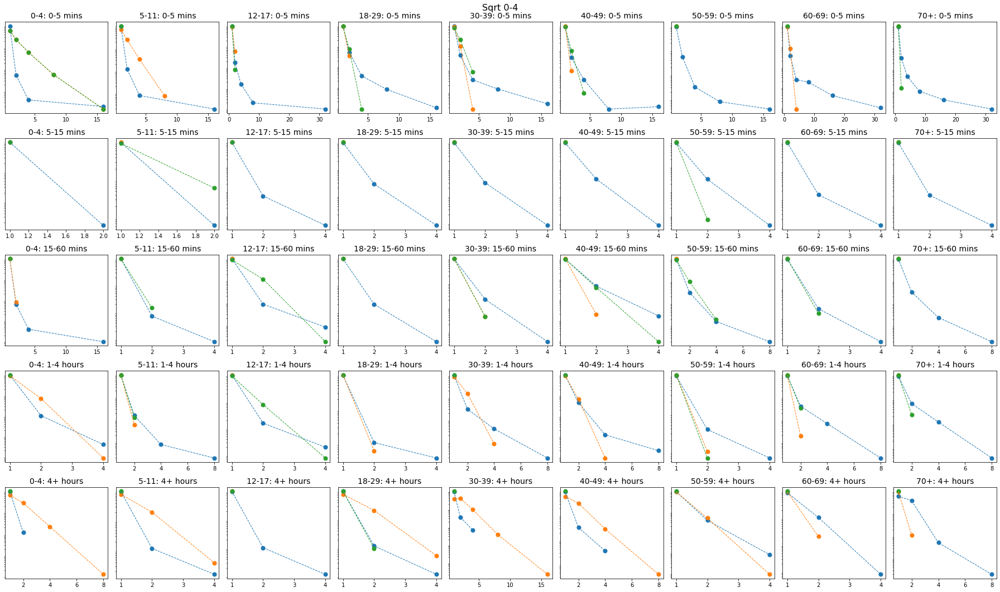

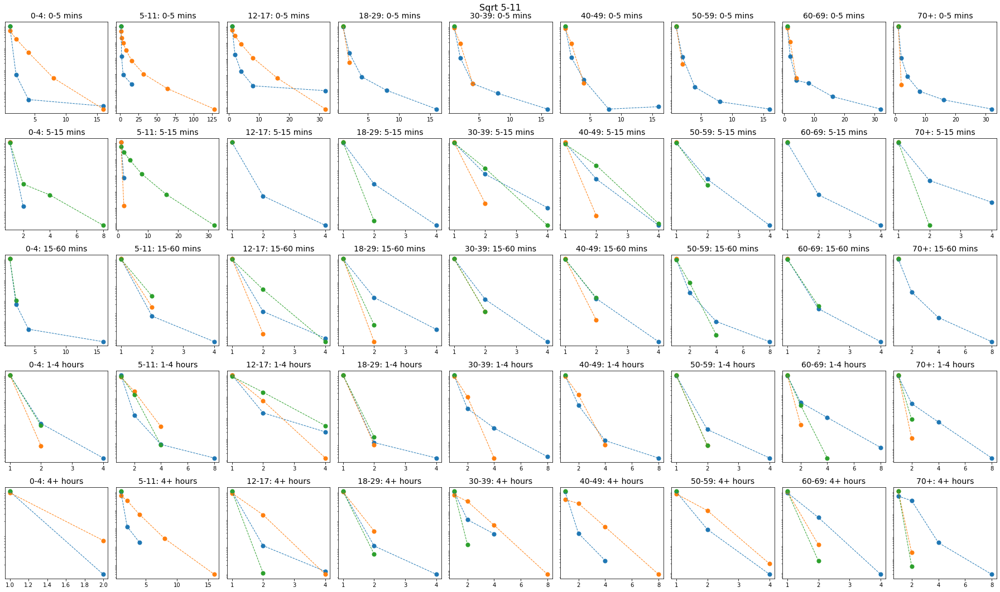

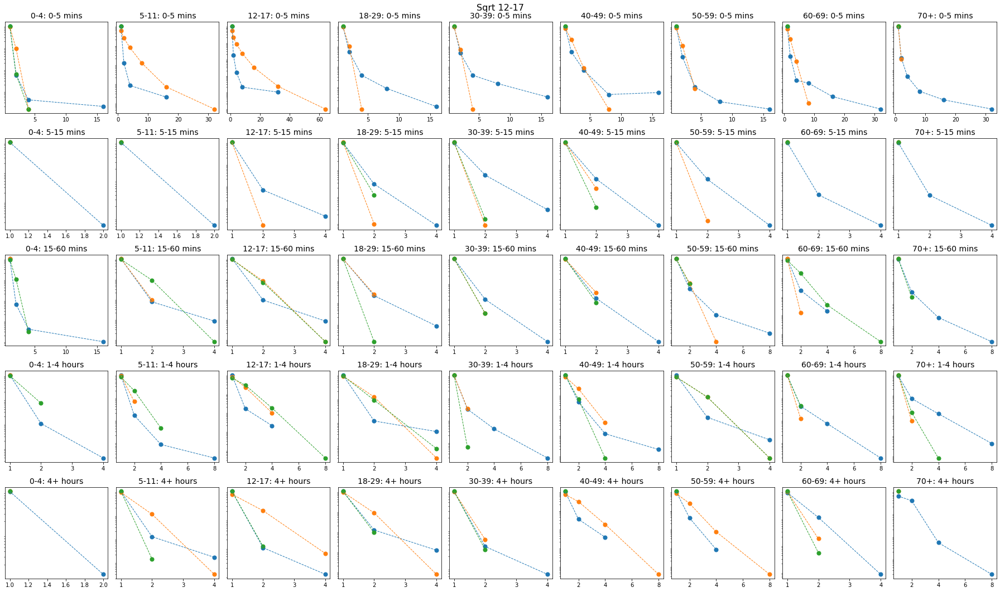

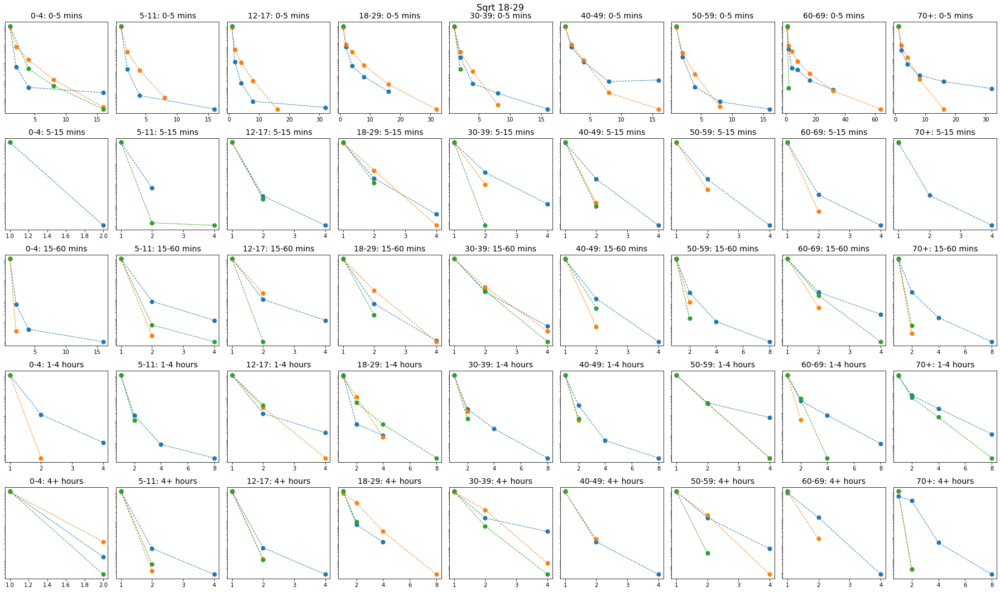

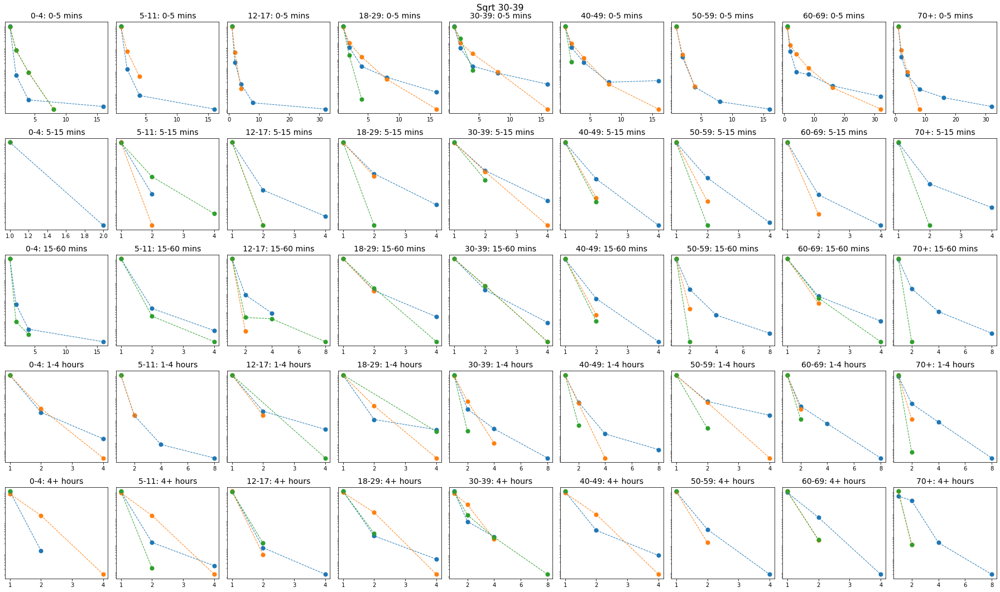

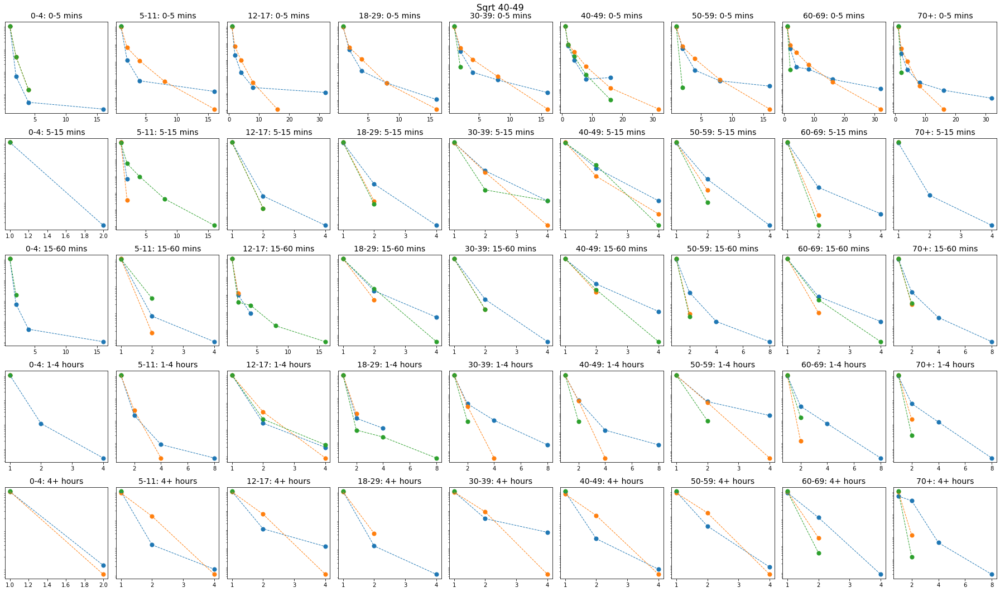

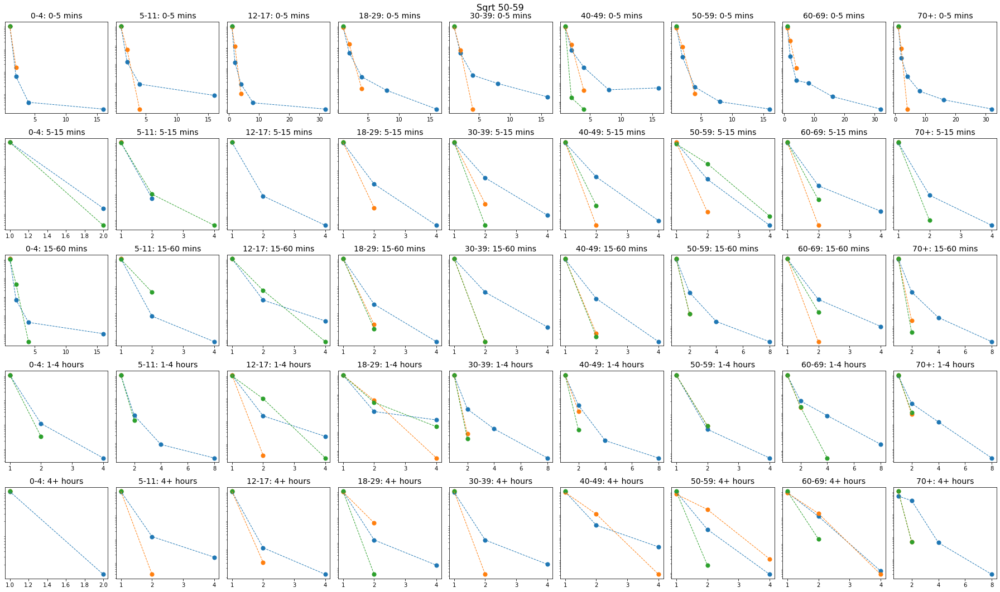

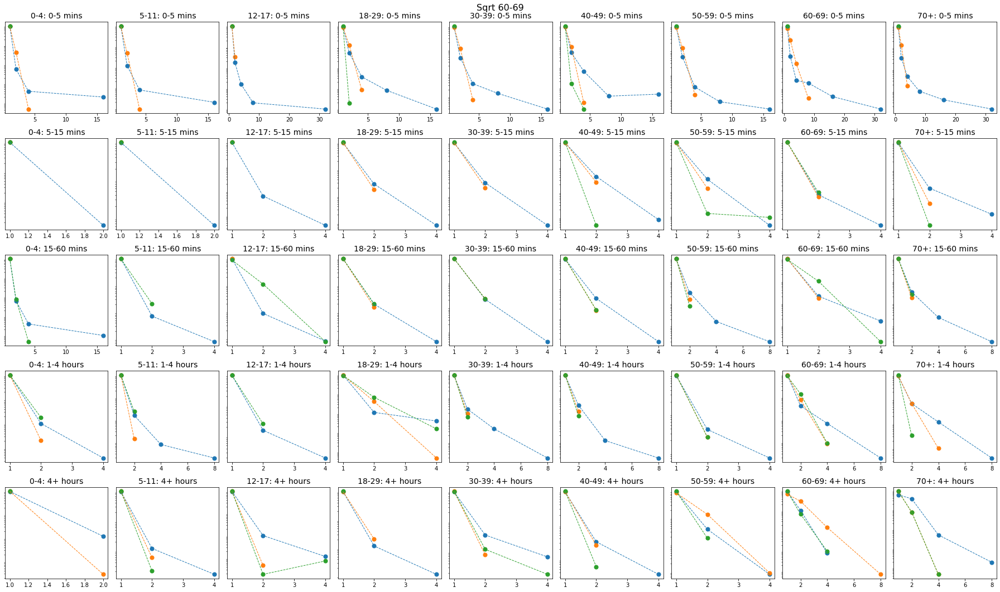

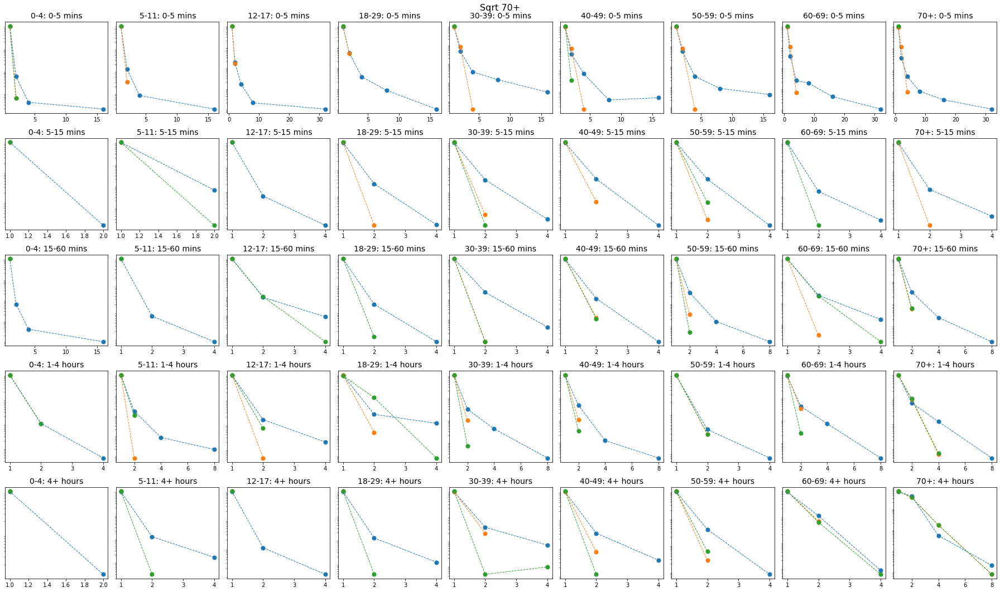

In [2]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p 
import numpy as np
import json
import sklearn.mixture
import math
import matplotlib.pyplot as plt

n = 100_000
num_networks = 1

buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]

per_partition = [a+1 if i == 0 else a-partitions[i-1] for i, a in enumerate(partitions)]

bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-5 mins', '5-15 mins', '15-60 mins', '1-4 hours', '4+ hours']
datas = ['comix3']

for i, data in enumerate(datas):
    with open(f'data/gmm_opt_comp/optimal_components_{data}_log_dur.json', 'r') as f:
        optimal_num_components = json.load(f)
    ##################### read fits ####################################
    with open(f'../input_data/egos/{data}_dur.json', 'r') as f:
        egos = json.load(f)

    for k in range(num_networks):
        samples_for_plot = []
        classifier = []
        samples = []
        for l, _ in enumerate(partitions):
            samples_for_plot.append([])
            classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
            egos_age = [a for a in egos if a['age'] == l]
            ## use log(k+1) instead of k to fit
            X = [[math.log(b+1) for b in a['contacts']] for a in egos_age]
            classifier[l].fit(X)
            ## sample same number of people as the data
            samples_tmp,_ = classifier[l].sample(per_partition[l])
            for sample in samples_tmp:
                samples.append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
                samples_for_plot[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        network = nd_p.gmm_dur_network(samples,partitions=partitions,num_dur=5)
        print(len(samples),len(network['ages']), len(network['degrees']))
        # print(sum([a['degree'] for a in egos])/len(egos),sum([sum(a) for a in samples])/len(samples), sum([sum(a) for a in network['degrees']])/len(network['degrees']))

per_partition = [100_000 for _ in bucket_labels]
n_rows, n_cols = 5, 9  # subplot grid per figure
for l, _ in enumerate(bucket_labels):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 15))
    fig.suptitle(f"Sqrt {bucket_labels[l]}", fontsize=16) 

    for d in range(len(samples[0])):
        # plt.figure(figsize=(12,10))
        tmp_egos = [a['contacts'][d] for a in egos_age]
        max_val = max(tmp_egos)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_egos, bins,density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        
        axes[d%5][d//5].scatter(x,y, label='Data',s=50,color='tab:blue')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:blue')
        
        tmp_gmm = [a[d] for a in samples_for_plot[l]]
        max_val = max(tmp_gmm)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_gmm, bins,density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]

        axes[d%5][d//5].scatter(x,y, label='GMM',s=50, color='tab:orange')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:orange')
        
        tmp_gmm = [network['frequency_distribution'][i][d//5][d%5] for i, a in enumerate(network['ages']) if a==l]
        max_val = max(tmp_gmm)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_gmm, bins,density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]

        axes[d%5][d//5].scatter(x,y, label='Network',s=50, color='tab:green')
        axes[d%5][d//5].plot(x,y,'--',linewidth=1, color='tab:green')
        
        axes[d%5][d//5].set_yscale('log')
        axes[d%5][d//5].set_title(f"{bucket_labels[d//5]}: {duration_labels[d%5]}", fontsize=14)
        # axes[d%5][d//5].set_xticks([])
        axes[d%5][d//5].set_yticks([])
        
    plt.tight_layout()
    fig.savefig(f'figs/gmm_dd/big_{l}_network', )
    print(l)

# Try reducing the number of durations to 3

In [ ]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p 
import numpy as np
import json
import sklearn.mixture
import math
import matplotlib.pyplot as plt

n = 100_000
max_comps = 20
buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]

per_partition = [a+1 if i == 0 else a-partitions[i-1] for i, a in enumerate(partitions)]

bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-5 mins', '1-4 hours', '4+ hours']
datas = ['comix3']
optimal = {}
for i, data in enumerate(datas):
    # ##################### read fits ####################################
    with open(f'../input_data/egos/{data}_dur.json', 'r') as f:
        egos = json.load(f)
    ## change egos from 5 durations to 3. (0-1,1-4,4+)
    egos_new = []
    for ego in egos:
        egos_new.append({'age': ego['age'], 'contacts': [a if index%5 in [3,4] else ego['contacts'][index]+ego['contacts'][index+1]+ego['contacts'][index+2] for index, a in enumerate(ego['contacts']) if index%5 in [0,3,4]], 'degree': ego['degree']})
    with open(f'../input_data/egos/{data}_dur_small.json','w') as f:
        json.dump(egos_new, f)
    for model_num in range(3):
        if model_num != 1: 
            continue
        with open(f'../input_data/egos/{data}_dur_small.json','r') as f:
            egos = json.load(f)
        for age, _ in enumerate(partitions):
            print(age)
            egos_age = [a for a in egos if a['age'] == age]
            ## use log(k+1) instead of k to fit
            X = [[b if model_num == 0 else math.log(b+1) if model_num == 1 else math.sqrt(0 if math.log(b+1) < 0 else math.log(b+1)) for b in a['contacts']] for a in egos_age]
            ## split into training and testing data 
            # Generate random indices
            indices = np.arange(len(X))
            split_idx = int(0.8 * len(X))

            bic_scores = []

            # find optimal number of components
            for i in range(1,max_comps):
                print(i)
                bic_scores.append([])
                for j in range(10):
                    np.random.shuffle(indices)

                    # Split data
                    X_train = [X[i] for i in indices[:split_idx]]
                    X_test = [X[i] for i in indices[split_idx:]]
                    bic_scores[-1].append([0,0])
                    classifier = sklearn.mixture.GaussianMixture(n_components=i, covariance_type='full')
                    classifier.fit(X_train)
                    bic_scores[-1][-1][0] = classifier.bic(np.array(X_train))/4
                    bic_scores[-1][-1][1] = classifier.bic(np.array(X_test))
                
            with open(f'data/gmm_bic/{data}_BIC_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}_smalldur.json', 
                      ) as f:
                json.dump(bic_scores, f)
            # try: 
            with open(f'data/gmm_bic/{data}_BIC_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}_smalldur.json', 'r') as f:
                bic_scores = json.load(f)

    for model_num in range(3):
        if model_num != 1: 
            continue
        print(data, model_num)
        optimal[data] = []
        ################ plot optimal number of components ###############
        for age, _ in enumerate(partitions):
            with open(f'data/gmm_bic/{data}_BIC_{age}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}_smalldur.json', 'r') as f:
                bic_scores = json.load(f)
            test_vals = [np.median([b[1] for b in a]) for a in bic_scores]
            optimal[data].append(int(np.argmin(test_vals))+1)
        with open(f'data/gmm_opt_comp/optimal_components_{data}_{"none" if model_num==0 else "log" if model_num==1 else "sqrt"}_smalldur.json', 'w') as f:
            json.dump(optimal, f)
        print(optimal)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
1
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
2
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
3
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
4
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
5
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
6
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
7
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
8
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
comix3 1
{'comix3': [1, 4, 3, 7, 3, 7, 4, 2, 3]}


### plot fits 3 durations

In [ ]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p 
import numpy as np
import json
import sklearn.mixture
import math
import matplotlib.pyplot as plt

n = 100_000
num_networks = 1

buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]

per_partition = [a+1 if i == 0 else a-partitions[i-1] for i, a in enumerate(partitions)]

bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-1 hour', '1-4 hours', '4+ hours']
datas = ['comix3']

for i, data in enumerate(datas):
    with open(f'data/gmm_opt_comp/optimal_components_{data}_log_smalldur.json', 'r') as f:
        optimal_num_components = json.load(f)
    ##################### read fits ####################################
    with open(f'../input_data/egos/{data}_dur_small.json', 'r') as f:
        egos = json.load(f)

    for k in range(num_networks):
        samples_for_plot = []
        classifier = []
        samples = []
        for l, _ in enumerate(partitions):
            samples_for_plot.append([])
            classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
            egos_age = [a for a in egos if a['age'] == l]
            ## use log(k+1) instead of k to fit
            X = [[math.log(b+1) for b in a['contacts']] for a in egos_age]
            classifier[l].fit(X)
            ## sample same number of people as the data
            samples_tmp,_ = classifier[l].sample(per_partition[l])
            for sample in samples_tmp:
                samples.append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
                samples_for_plot[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        network = nd_p.gmm_dur_network(samples,partitions=partitions,num_dur=len(duration_labels))
        print(len(samples),len(network['ages']), len(network['degrees']))
        # print(sum([a['degree'] for a in egos])/len(egos),sum([sum(a) for a in samples])/len(samples), sum([sum(a) for a in network['degrees']])/len(network['degrees']))

n_rows, n_cols = len(duration_labels), len(bucket_labels)  # subplot grid per figure
for l, _ in enumerate(bucket_labels):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(25, 12))
    fig.suptitle(f"Sqrt {bucket_labels[l]}", fontsize=16) 

    for d in range(len(samples[0])):
        # plt.figure(figsize=(12,10))
        tmp_egos = [a['contacts'][d] for a in egos_age]
        max_val = max(tmp_egos)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_egos, bins,density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]
        
        axes[d%3][d//3].scatter(x,y, label='Data',s=50,color='tab:blue')
        axes[d%3][d//3].plot(x,y,'--',linewidth=1, color='tab:blue')
        
        tmp_gmm = [a[d] for a in samples_for_plot[l]]
        max_val = max(tmp_gmm)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_gmm, bins,density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]

        axes[d%3][d//3].scatter(x,y, label='GMM',s=50, color='tab:orange')
        axes[d%3][d//3].plot(x,y,'--',linewidth=1, color='tab:orange')
        
        tmp_gmm = [network['frequency_distribution'][i][d//3][d%3] for i, a in enumerate(network['ages']) if a==l]
        max_val = max(tmp_gmm)+1
        bins = [0, 1] + [2**k for k in range(1, int(np.ceil(np.log2(max_val)))+1)]
        y,x = np.histogram(tmp_gmm, bins,density=True)
        x,y = [a for j, a in enumerate(x[1:]) if y[j]>0], [a for a in y if a>0]
        if len(y) == 0: 
            x=[1]; y=[1]

        axes[d%3][d//3].scatter(x,y, label='Network',s=50, color='tab:green')
        axes[d%3][d//3].plot(x,y,'--',linewidth=1, color='tab:green')
        
        axes[d%3][d//3].set_yscale('log')
        axes[d%3][d//3].set_title(f"{bucket_labels[d//3]}: {duration_labels[d%3]}", fontsize=14)
        # axes[d%3][d//3].set_xticks([])
        axes[d%3][d//3].set_yticks([])
        
    plt.tight_layout()
    fig.savefig(f'figs/gmm_dd/big_3dur_{l}', )
    print(l)

100000 100000 100000
0
1
2
3


### run simulations

In [2]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p 
import numpy as np
import json
import sklearn.mixture
import math
import matplotlib.pyplot as plt

n = 100_000
num_networks,iters = 1, 5

buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]

per_partition = [a+1 if i == 0 else a-partitions[i-1] for i, a in enumerate(partitions)]

bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-1 hour', '1-4 hours', '4+ hours']
datas = ['comix3']

taus = np.arange(0.05,2,0.05)

for i, data in enumerate(datas):
    with open(f'data/gmm_opt_comp/optimal_components_{data}_log_smalldur.json', 'r') as f:
        optimal_num_components = json.load(f)
    ##################### read fits ####################################
    with open(f'../input_data/egos/{data}_dur_small.json', 'r') as f:
        egos = json.load(f)

    for k in range(num_networks):
        samples_for_plot = []
        classifier = []
        samples = []
        for l, _ in enumerate(partitions):
            samples_for_plot.append([])
            classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
            egos_age = [a for a in egos if a['age'] == l]
            ## use log(k+1) instead of k to fit
            X = [[math.log(b+1) for b in a['contacts']] for a in egos_age]
            classifier[l].fit(X)
            ## sample same number of people as the data
            samples_tmp,_ = classifier[l].sample(per_partition[l])
            for sample in samples_tmp:
                samples.append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
                samples_for_plot[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        result = nd_p.gmm_dur(samples,partitions=partitions,taus=taus, iterations=iters, inv_gamma=7, prop_infec=10/n, num_dur=3)
        with open(f'data/sims/3dur_{data}_{k}.json','w') as f:
            json.dump(result, f)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38


### plot sims

NameError: name 'data' is not defined

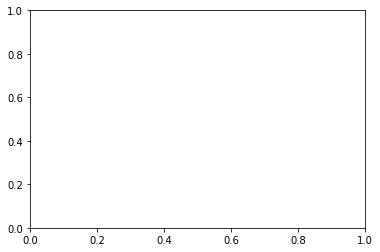

In [1]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p 
import numpy as np
import json
import sklearn.mixture
import math
import matplotlib.pyplot as plt

fs, r0, taus = [], [], []
tau_to_index = {}
for k in range(3):
    with open(f'data/sims/3dur_{data}_{k}.json', 'r') as f:
        res = json.load(f)
    for i,vec in enumerate(res['r0']):
        tau_val = res['taus'][i]
        if tau_val not in tau_to_index.keys():
            fs.append([]); r0.append([]); taus.append(res['taus'][i])
            tau_to_index[tau_val] = len(taus)-1
        ## use i as np.where taus == current tau
        idx = tau_to_index[tau_val]
        for j, val in enumerate(vec):
            if val != -1:
                r0[idx].append(val); 
            if res['fs'][i][j] != -1:
                fs[idx].append(res['fs'][i][j])

plt.figure(figsize=(12,10))
plt.plot([np.median(a) for a in r0 if len(a)>0], [np.median(a) for a in fs if len(a)>0])
plt.fill_between([np.median(a) for a in r0 if len(a)>0], [np.percentile(a,5) for a in fs if len(a)>0],[np.percentile(a,95) for a in fs if len(a)>0], alpha=0.4)
plt.xlabel('Final size')
plt.ylabel('R0')
plt.title('comix3')
plt.ylim(0,1)
plt.xlim(0,4)
plt.show()


plt.figure(figsize=(12,10))
plt.plot([a for i,a in enumerate(taus) if len(r0[i]) > 0], [np.median(a) for a in r0 if len(a)>0])
plt.xlabel('beta')
plt.ylabel('R0')
plt.title('comix3')
plt.ylim(0,4)
plt.show()

plt.figure(figsize=(12,10))
plt.plot([a for i,a in enumerate(taus) if len(r0[i]) > 0], [np.median(a) for a in fs if len(a)>0])
plt.xlabel('beta')
plt.ylabel('Final Size')
plt.title('comix3')
plt.ylim(0,1)
plt.show()

# Figure out what is going on in network building

In [ ]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p 
import numpy as np
import json
import sklearn.mixture
import math
import matplotlib.pyplot as plt

n = 100_000
num_networks= 1

buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]

per_partition = [a if i == 0 else a-partitions[i-1] for i, a in enumerate(partitions)]

bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-1 hour', '1-4 hours', '4+ hours']
datas = ['comix3']


for i, data in enumerate(datas):
    with open(f'data/gmm_opt_comp/optimal_components_{data}_log_smalldur.json', 'r') as f:
        optimal_num_components = json.load(f)
    ##################### read fits ####################################
    with open(f'../input_data/egos/{data}_dur_small.json', 'r') as f:
        egos = json.load(f)

    for k in range(num_networks):
        samples_for_plot = []
        classifier = []
        samples = []
        for l, _ in enumerate(partitions):
            samples_for_plot.append([])
            classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
            egos_age = [a for a in egos if a['age'] == l]
            ## use log(k+1) instead of k to fit
            X = [[math.log(b+1) for b in a['contacts']] for a in egos_age]
            classifier[l].fit(X)
            ## sample same number of people as the data
            samples_tmp,_ = classifier[l].sample(per_partition[l])
            for sample in samples_tmp:
                samples.append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
                samples_for_plot[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        network = nd_p.gmm_dur_network(samples,partitions=partitions,num_dur=3)
        
for i, data in enumerate(datas):
    with open(f'data/gmm_opt_comp/optimal_components_{data}_log.json', 'r') as f:
        optimal_num_components = json.load(f)
    ##################### read fits ####################################
    with open(f'../input_data/egos/{data}.json', 'r') as f:
        egos = json.load(f)

    for k in range(num_networks):
        samples_for_plot1 = []
        classifier = []
        samples1 = []
        for l, _ in enumerate(partitions):
            samples_for_plot1.append([])
            classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
            egos_age = [a for a in egos if a['age'] == l]
            ## use log(k+1) instead of k to fit
            X = [[math.log(b+1) for b in a['contacts']] for a in egos_age]
            classifier[l].fit(X)
            ## sample same number of people as the data
            samples_tmp,_ = classifier[l].sample(per_partition[l])
            for sample in samples_tmp:
                samples1.append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
                samples_for_plot1[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        network1 = nd_p.gmm_network(samples1,partitions=partitions)

In [2]:
print(network['frequency_distribution'][0])
print(samples[0])
samples_new = [[[0,0,0] for _ in range(9)] for _ in range(len(samples))]
for i, sample in enumerate(samples):
    for j, s in enumerate(sample):
        samples_new[i][j//3][j%3] = s
print(samples_new[0])


[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0]]
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[[0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 1], [0, 0, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0]]


In [3]:
print(per_partition)
counts = np.zeros(9)
for i in network['ages']:
    counts[i] += 1
print(counts)

[580.0, 870.0, 670.0, 1520.0, 1330.0, 1260.0, 1360.0, 1070.0, 1340.0]
[ 580.  870.  670. 1520. 1330. 1260. 1360. 1070. 1340.]


3.2308
3.8038


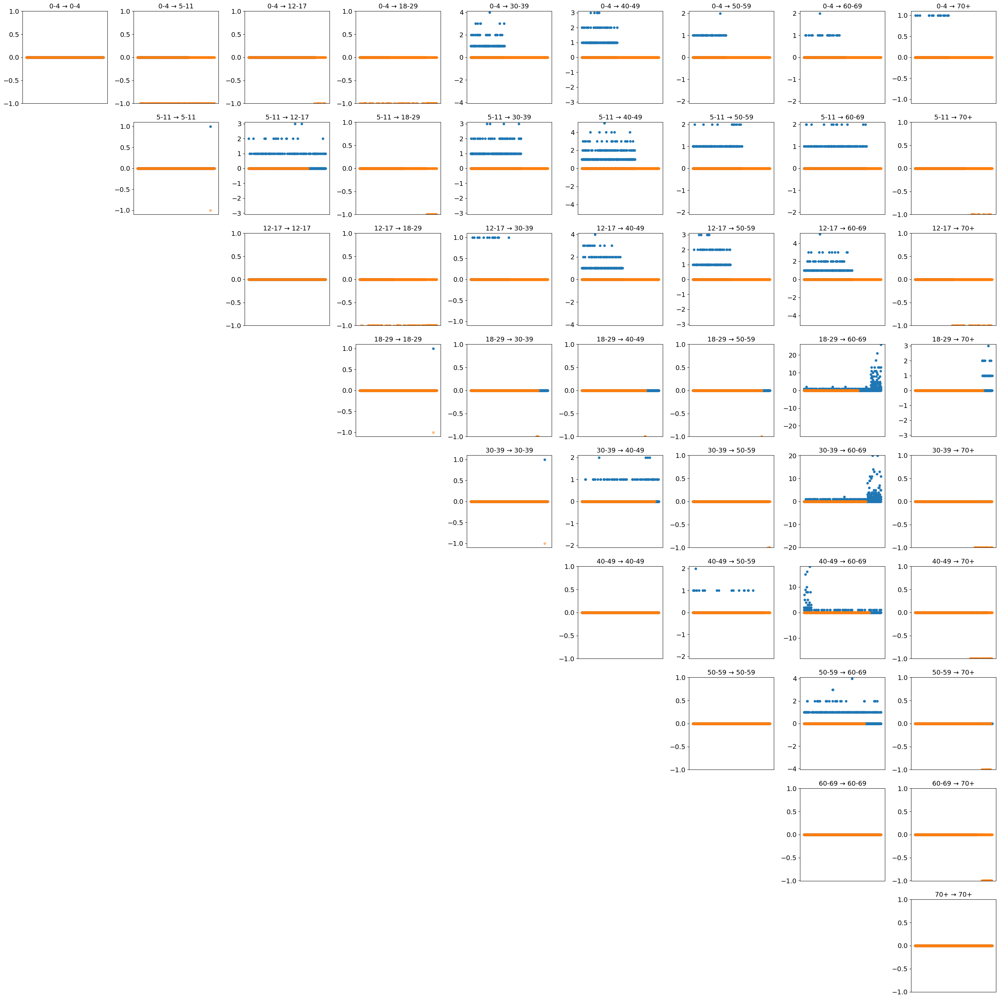

In [4]:
print(sum([sum(a) for a in network1['frequency_distribution']])/len(network1['frequency_distribution']))
print(sum([sum(a) for a in samples1])/len(samples1))

bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']

# 9x9 subplot grid
fig, axes = plt.subplots(9, 9, figsize=(30, 30))  # adjust size as needed

for k in range(9):
    for i in range(9):
        ax = axes[k, i]

        if i < k:  # lower triangle (optional: hide)
            ax.axis("off")
            continue

        # --- k -> i direction ---
        samples_tmp = [a for idx, a in enumerate(samples1) if (idx < partitions[k] and idx >= partitions[k-1])] if k > 0 else [a for idx, a in enumerate(samples1) if idx < partitions[k]]
        network_tmp = [a for idx, a in enumerate(network1['frequency_distribution']) if network1['ages'][idx] == k]

        differences1 = np.zeros(len(samples_tmp))
        for j in range(len(differences1)):
            differences1[j] = samples_tmp[j][i] - network_tmp[j][i]

        ax.scatter(range(len(differences1)), differences1, s=20)
        ax.set_title(f'{bucket_labels[k]} → {bucket_labels[i]}', fontsize=14)
        

        # --- optional: i -> k direction ---
        # If you only want one plot per cell, remove this block
        samples_tmp = [a for idx, a in enumerate(samples1) if (idx < partitions[i] and idx >= partitions[i-1])] if i > 0 else [a for idx, a in enumerate(samples1) if idx < partitions[i]]
        network_tmp = [a for idx, a in enumerate(network1['frequency_distribution']) if network1['ages'][idx] == i]

        differences2 = np.zeros(len(samples_tmp))
        for j in range(len(differences2)):
            differences2[j] = -(samples_tmp[j][k] - network_tmp[j][k])

        # overlay second direction in red
        ax.scatter(range(len(differences2)), differences2, s=20, color="tab:orange", alpha=0.5)
        if max(differences2)+max(differences1) == 0:
            ax.set_ylim(-1, 1)
        else:
            ax.set_ylim(-max(max(differences1), max(np.abs(differences2)))-.1, max(max(differences1), max(np.abs(differences2)))+.1)
        ax.set_xticks([])

plt.tight_layout()
plt.savefig('check_nodur.png')
plt.show()


In [26]:
print(samples[0])

[1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


## Before fix

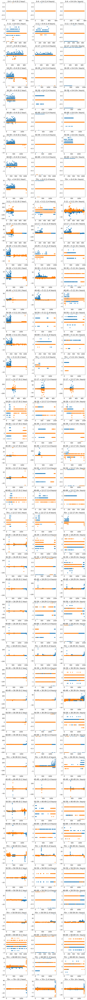

In [5]:
# with durations
bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-1 hour', '1-4 hours', '4+ hours']


# Count how many subplots are needed (2 plots per (k,i,d) iteration)
n_plots = 0
for k in range(9):
    for i in range(k, 9):
        for d in range(3):
            n_plots += 1

# Decide grid shape (e.g., square-ish)
ncols = 3
nrows = int(np.ceil(n_plots / ncols))

# Create one big figure
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows))
axes = axes.flatten()  # flatten to 1D for easy indexing

plot_idx = 0
for k in range(9):
    for i in range(k, 9):
        for d in range(3):
            # First direction (k -> i)
            samples_tmp = [a for idx, a in enumerate(samples) if (idx < partitions[k] and idx >= partitions[k-1])] if k>0 else [a for idx, a in enumerate(samples) if idx < partitions[k]]
            network_tmp = [a for idx, a in enumerate(network['frequency_distribution']) if network['ages'][idx] == k]

            differences1 = np.zeros(len(samples_tmp))
            for j in range(len(differences1)):
                differences1[j] = samples_tmp[j][i*d+d] - network_tmp[j][i][d]

            ax = axes[plot_idx]
            ax.scatter(range(len(differences1)), differences1)
            ax.set_title(f'{bucket_labels[k]} → {bucket_labels[i]} ({duration_labels[d]})')

            # Reverse direction (i -> k)
            samples_tmp = [a for idx, a in enumerate(samples) if (idx < partitions[i] and idx >= partitions[i-1])] if i>0 else [a for idx, a in enumerate(samples) if idx < partitions[i]]
            network_tmp = [a for idx, a in enumerate(network['frequency_distribution']) if network['ages'][idx] == i]

            differences2 = np.zeros(len(samples_tmp))
            for j in range(len(differences2)):
                differences2[j] = - (samples_tmp[j][k*d+d] - network_tmp[j][k][d])

            ax = axes[plot_idx]
            ax.scatter(range(len(differences2)), differences2)
            ax.set_title(f'{bucket_labels[i]} → {bucket_labels[k]} ({duration_labels[d]})')
            if max(differences2)+max(differences1) == 0:
                ax.set_ylim(-1, 1)
            else:
                ax.set_ylim(-max(max(differences1), max(differences2)), max(max(differences1), max(differences2)))
            plot_idx += 1

# Adjust layout
for ax in axes[plot_idx:]:
    ax.axis("off")  # hide unused panels if any
plt.tight_layout()
plt.savefig('check_dur_before.png')
plt.show()

## After

In [ ]:
print(len(samples[0]), len(network['frequency_distribution']))

27 3


In [11]:
ages = np.zeros(9)
for a in network['ages']:
    ages[a] += 1
print(ages)
print(per_partition)

[ 5800.  8700.  6700. 15200. 13300. 12600. 13600. 10700. 13400.]
[np.float64(5800.0), np.float64(8700.0), np.float64(6700.0), np.float64(15200.0), np.float64(13300.0), np.float64(12600.0), np.float64(13600.0), np.float64(10700.0), np.float64(13400.0)]


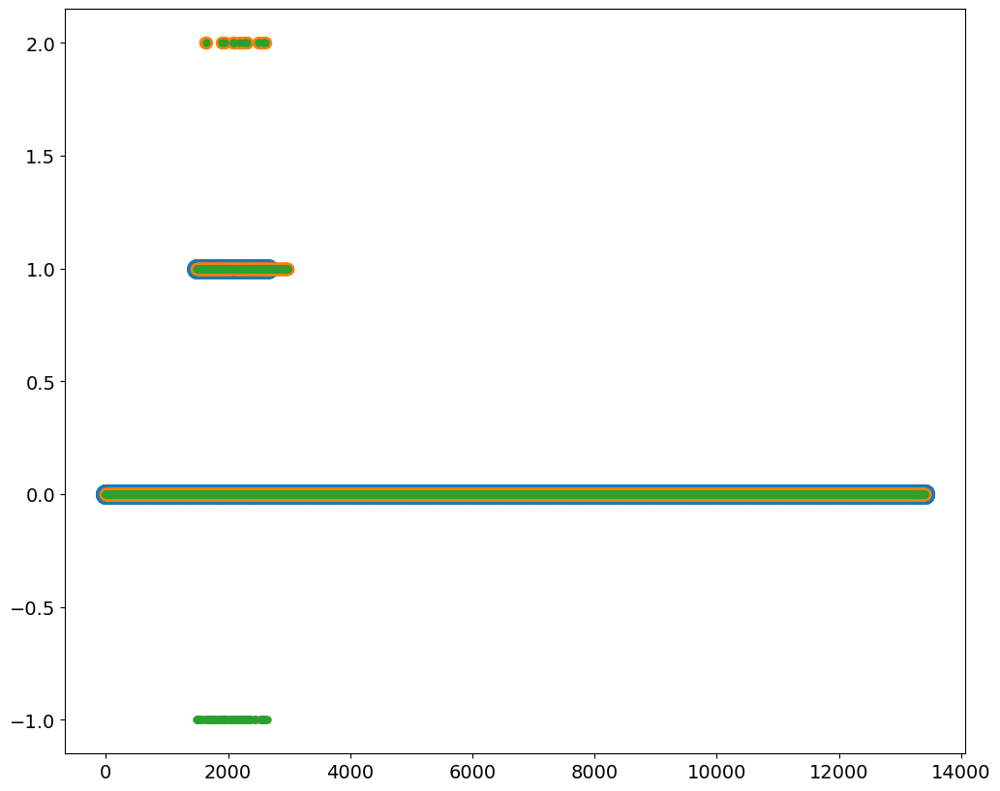

In [ ]:
k=1; i=1;
samples_tmp = [a for idx, a in enumerate(samples) if (idx < partitions[k] and idx >= partitions[k-1])] if k>0 else [a for idx, a in enumerate(samples) if idx < partitions[k]]
network_tmp = [a for idx, a in enumerate(network['frequency_distribution']) if network['ages'][idx] == k]
group_n = [a[1][1] for a in network_tmp]
group_s = [a[1*9+1] for a in samples_tmp]
plt.figure(figsize=(12,10))
plt.scatter(range(len(group_n)),group_n,s=200)
plt.scatter(range(len(group_s)),group_s,s=75)
plt.scatter(range(len(group_n)),np.array(group_s)-np.array(group_n),s=25)
plt.show()

In [ ]:
totals = np.zeros(9); per_group = np.zeros(9)
for ego in egos:
    totals[ego['age']] += ego['degree']
    per_group[ego['age']] += 1
totals /= per_group
print(totals)
print(sum(totals*np.array(per_partition))/n)

[5.37135279 9.86098239 9.61743656 4.87631976 4.2768559  4.33089245
 3.29496047 6.53491124 2.53791469]
5.156957761478617


3.10026 3.99637


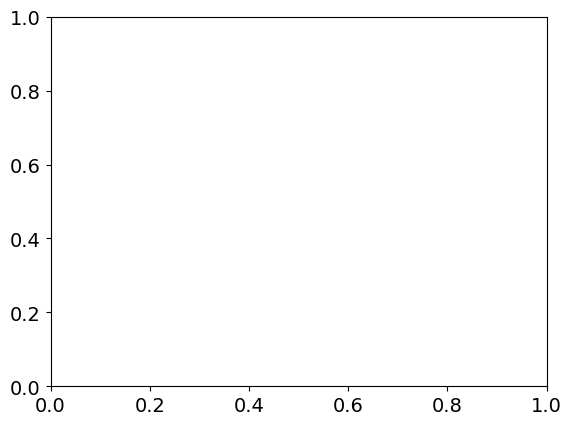

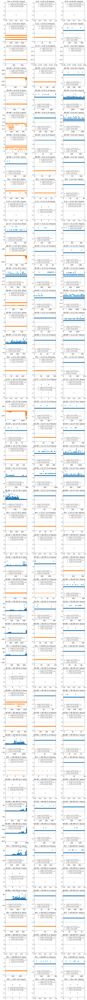

In [1]:
import sys
import os
sys.path.append(os.path.abspath('..'))
import nd_python_avon as nd_p 
import numpy as np
import json
import sklearn.mixture
import math
import matplotlib.pyplot as plt

n = 100_000
num_networks= 1

buckets = np.array([5,12,18,30,40,50,60,70])
partitions = [0.058*n, 0.145*n, 0.212*n, 0.364*n, 0.497*n, 0.623*n, 0.759*n, 0.866*n, n]
partitions = [np.round(a) for a in partitions]

per_partition = [a if i == 0 else a-partitions[i-1] for i, a in enumerate(partitions)]

bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-1 hour', '1-4 hours', '4+ hours']
datas = ['comix3']


for i, data in enumerate(datas):
    with open(f'data/gmm_opt_comp/optimal_components_{data}_log_smalldur.json', 'r') as f:
        optimal_num_components = json.load(f)
    ##################### read fits ####################################
    with open(f'../input_data/egos/{data}_dur_small.json', 'r') as f:
        egos = json.load(f)

    for k in range(num_networks):
        samples_for_plot = []
        classifier = []
        samples = []
        for l, _ in enumerate(partitions):
            samples_for_plot.append([])
            classifier.append(sklearn.mixture.GaussianMixture(n_components=optimal_num_components[data][l], covariance_type='full'))
            egos_age = [a for a in egos if a['age'] == l]
            ## use log(k+1) instead of k to fit
            X = [[math.log(b+1) for b in a['contacts']] for a in egos_age]
            classifier[l].fit(X)
            ## sample same number of people as the data
            samples_tmp,_ = classifier[l].sample(per_partition[l])
            for sample in samples_tmp:
                samples.append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
                samples_for_plot[-1].append([int(np.round(np.exp(b)-1)) if int(np.round(np.exp(b)-1))>=0 else 0 for b in sample])
        network = nd_p.gmm_dur_network(samples,partitions=partitions,num_dur=3)
        
# with durations
bucket_labels = ['0-4', '5-11', '12-17', '18-29', '30-39', '40-49', '50-59', '60-69', '70+']
duration_labels = ['0-1 hour', '1-4 hours', '4+ hours']


# Count how many subplots are needed (2 plots per (k,i,d) iteration)
n_plots = 0
for k in range(9):
    for i in range(k, 9):
        for d in range(3):
            n_plots += 1

# Decide grid shape (e.g., square-ish)
ncols = 3
nrows = int(np.ceil(n_plots / ncols))
num_d = 3
# Create one big figure
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows))
axes = axes.flatten()  # flatten to 1D for easy indexing
print(sum([sum([sum(b) for b in a]) for a in network['frequency_distribution']])/len(network['frequency_distribution']), sum([sum(a) for a in samples])/len(samples))
plot_idx = 0
for k in range(9):
    for i in range(k, 9):
        for d in range(num_d):
            # First direction (k -> i)
            samples_tmp = [a for idx, a in enumerate(samples) if (idx < partitions[k] and idx >= partitions[k-1])] if k>0 else [a for idx, a in enumerate(samples) if idx < partitions[k]]
            network_tmp = [a for idx, a in enumerate(network['frequency_distribution']) if network['ages'][idx] == k]

            differences1 = np.zeros(len(samples_tmp))
            for j in range(len(differences1)):
                differences1[j] = samples_tmp[j][i*num_d+d] - network_tmp[j][i][d]
            max_sample = max([a[i*num_d+d] for a in samples_tmp]); mean_sample = np.mean([a[i*num_d+d] for a in samples_tmp])
            max_network = max([a[i][d] for a in network_tmp]); mean_network = np.mean([a[i][d] for a in network_tmp])
            total_sample = sum([a[i*num_d+d] for a in samples_tmp]); total_network = sum([a[i][d] for a in network_tmp])

            ax = axes[plot_idx]
            ax.set_title(f'{bucket_labels[k]} → {bucket_labels[i]} ({duration_labels[d]})')
            differences1 = [a for a in differences1 if abs(a) != 0]
            ax.scatter(range(len(differences1)), differences1, label=f'S: max={max_sample}, m={np.round(mean_sample,2)}, tot={total_sample}\nNetwork: max={max_network}, m={np.round(mean_network,2)}, tot={total_network}')            
            # ax.scatter(range(len(differences1)), differences1, s=20)
            # Reverse direction (i -> k)
            samples_tmp = [a for idx, a in enumerate(samples) if (idx < partitions[i] and idx >= partitions[i-1])] if i>0 else [a for idx, a in enumerate(samples) if idx < partitions[i]]
            network_tmp = [a for idx, a in enumerate(network['frequency_distribution']) if network['ages'][idx] == i]

            differences2 = np.zeros(len(samples_tmp))
            for j in range(len(differences2)):
                differences2[j] = - (samples_tmp[j][k*num_d+d] - network_tmp[j][k][d])
            max_sample = max([a[k*num_d+d] for a in samples_tmp]); mean_sample = np.mean([a[k*num_d+d] for a in samples_tmp])
            max_network = max([a[k][d] for a in network_tmp]); mean_network = np.mean([a[k][d] for a in network_tmp])
            total_sample = sum([a[k*num_d+d] for a in samples_tmp]); total_network = sum([a[k][d] for a in network_tmp])
            

            ax = axes[plot_idx]
            ax.set_title(f'{bucket_labels[i]} → {bucket_labels[k]} ({duration_labels[d]})')
            ax.plot([-1, max(len(differences2),len(differences1))], [0, 0], '--', color='gray') 
            ax.set_ylim(-max(max(differences1) if len(differences1)>0 else 0, -min(differences2) if len(differences2)>0 else 0)-1, max(max(differences1) if len(differences1)>0 else 0, -min(differences2) if len(differences2)>0 else 0)+1)
            differences2 = [a for a in differences2 if abs(a) != 0]
            ax.scatter(range(len(differences2)), differences2, label=f'S: max={max_sample}, m={np.round(mean_sample,2)}, tot={total_sample}, \nN: max={max_network}, m={np.round(mean_network,2)}, tot={total_network}')
            plot_idx += 1
            ax.set_xlim(-1, max(len(differences2),len(differences1)))
            ax.legend(fontsize=8)

# Adjust layout
for ax in axes[plot_idx:]:
    ax.axis("off")  # hide unused panels if any
plt.tight_layout()
plt.savefig('check_dur_after.png')
plt.show()
plt.close()